# INDICIUM - Programa Lighthouse - Data Science

## Short-term rental pricing algorithm - NYC

# BIBLIOTECAS

In [2]:
!pip install sidetable
!pip install -U scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 10.3 MB/s eta 0:00:00


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from sklearn.preprocessing import scale, minmax_scale, power_transform, OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, root_mean_squared_error
from collections import Counter
import re
import joblib

In [5]:
sns.set_style("whitegrid")
plt.style.use('bmh')

# LEITURA E ANÁLISE INICIAL DOS DADOS

Nesse primeiro tópico o foco é conectar os dados e fazer análises preliminares, para entender melhor a distribuição dos dados.

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
data_initial = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Indicium/teste_indicium_precificacao.csv",na_values = "?")

## Estrutura dos dados

In [8]:
# Informações gerais sobre o dataframe
data_initial

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
1,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
2,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
3,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
4,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48889,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48890,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48891,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48892,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


<Figure size 1200x800 with 0 Axes>

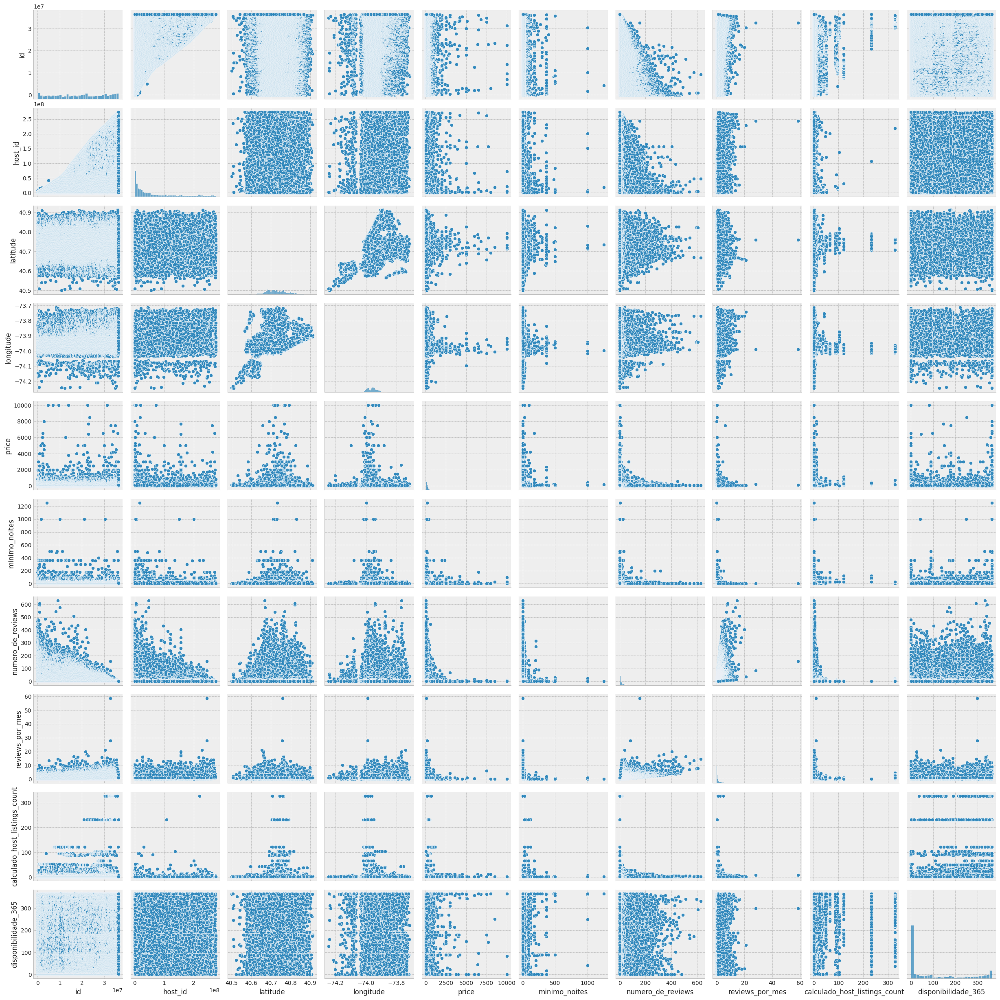

In [9]:
# Pairplot completo dos dados com a disposição original

plt.figure(figsize = (12,8))
sns.pairplot(data_initial)
plt.show()

In [10]:
# Estrutura, tipos e valores nulos
data_initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48894 entries, 0 to 48893
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             48894 non-null  int64  
 1   nome                           48878 non-null  object 
 2   host_id                        48894 non-null  int64  
 3   host_name                      48873 non-null  object 
 4   bairro_group                   48894 non-null  object 
 5   bairro                         48894 non-null  object 
 6   latitude                       48894 non-null  float64
 7   longitude                      48894 non-null  float64
 8   room_type                      48894 non-null  object 
 9   price                          48894 non-null  int64  
 10  minimo_noites                  48894 non-null  int64  
 11  numero_de_reviews              48894 non-null  int64  
 12  ultima_review                  38842 non-null 

In [11]:
# Quartis zerados, médias e desvios padrões à observar
data_initial.describe()

,id,host_id,latitude,longitude,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
count,4.889400e+04,4.889400e+04,48894.000000,48894.000000,48894.000000,48894.000000,48894.000000,38842.000000,48894.000000,48894.000000
mean,1.901753e+07,6.762139e+07,40.728951,-73.952169,152.720763,7.030085,23.274758,1.373251,7.144005,112.776169
std,1.098288e+07,7.861118e+07,0.054529,0.046157,240.156625,20.510741,44.550991,1.680453,32.952855,131.618692
min,2.595000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.472371e+06,7.822737e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967743e+07,3.079553e+07,40.723075,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915225e+07,1.074344e+08,40.763117,-73.936273,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [12]:
# Três tipos de imóveis
data_initial.groupby("room_type").count()

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
room_type,,,,,,,,,,,,,,,
Entire home/apt,25409,25402,25409,25400,25409,25409,25409,25409,25409,25409,25409,20332,20332,25409,25409
Private room,22325,22317,22325,22313,22325,22325,22325,22325,22325,22325,22325,17664,17664,22325,22325
Shared room,1160,1159,1160,1160,1160,1160,1160,1160,1160,1160,1160,846,846,1160,1160


In [13]:
# Descrição geral de price separado por tipo de imóvel
data_initial[['price', 'room_type']].groupby("room_type").describe()

price                                                    \
                   count        mean         std  min    25%    50%    75%   
room_type                                                                    
Entire home/apt  25409.0  211.794246  284.041611  0.0  120.0  160.0  229.0   
Private room     22325.0   89.778320  160.208360  0.0   50.0   70.0   95.0   
Shared room       1160.0   70.127586  101.725252  0.0   33.0   45.0   75.0   

                          
                     max  
room_type                 
Entire home/apt  10000.0  
Private room     10000.0  
Shared room       1800.0

In [14]:
# Cinco distritos diferentes
data_initial.groupby("bairro_group").count()

,id,nome,host_id,host_name,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
bairro_group,,,,,,,,,,,,,,,
Bronx,1091,1090,1091,1090,1091,1091,1091,1091,1091,1091,1091,876,876,1091,1091
Brooklyn,20103,20097,20103,20094,20103,20103,20103,20103,20103,20103,20103,16446,16446,20103,20103
Manhattan,21661,21652,21661,21652,21661,21661,21661,21661,21661,21661,21661,16632,16632,21661,21661
Queens,5666,5666,5666,5664,5666,5666,5666,5666,5666,5666,5666,4574,4574,5666,5666
Staten Island,373,373,373,373,373,373,373,373,373,373,373,314,314,373,373


In [15]:
# Descrição geral de price separado por distritos
data_initial[['price', 'bairro_group']].groupby("bairro_group").describe()

price                                                    \
                 count        mean         std   min   25%    50%    75%   
bairro_group                                                               
Bronx           1091.0   87.496792  106.709349   0.0  45.0   65.0   99.0   
Brooklyn       20103.0  124.381983  186.878105   0.0  60.0   90.0  150.0   
Manhattan      21661.0  196.875814  291.383183   0.0  95.0  150.0  220.0   
Queens          5666.0   99.517649  167.102155  10.0  50.0   75.0  110.0   
Staten Island    373.0  114.812332  277.620403  13.0  50.0   75.0  110.0   

                        
                   max  
bairro_group            
Bronx           2500.0  
Brooklyn       10000.0  
Manhattan      10000.0  
Queens         10000.0  
Staten Island   5000.0

In [16]:
# 221 bairros
data_initial.groupby("bairro").count()

,id,nome,host_id,host_name,bairro_group,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
bairro,,,,,,,,,,,,,,,
Allerton,42,42,42,42,42,42,42,42,42,42,42,37,37,42,42
Arden Heights,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
Arrochar,21,21,21,21,21,21,21,21,21,21,21,20,20,21,21
Arverne,77,77,77,77,77,77,77,77,77,77,77,66,66,77,77
Astoria,900,900,900,900,900,900,900,900,900,900,900,709,709,900,900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Windsor Terrace,157,157,157,157,157,157,157,157,157,157,157,128,128,157,157
Woodhaven,88,88,88,88,88,88,88,88,88,88,88,72,72,88,88
Woodlawn,11,11,11,11,11,11,11,11,11,11,11,11,11,11,11


In [17]:
# Descrição geral de price separado por bairros
data_initial[['price', 'bairro']].groupby("bairro").describe()

price                                                        \
                 count        mean         std    min     25%    50%     75%   
bairro                                                                         
Allerton          42.0   87.595238   73.048617   33.0   47.00   66.5  104.75   
Arden Heights      4.0   67.250000   18.300729   41.0   62.75   72.5   77.00   
Arrochar          21.0  115.000000  133.119120   32.0   34.00   65.0  125.00   
Arverne           77.0  171.779221  193.347902   35.0   75.00  125.0  200.00   
Astoria          900.0  117.187778  349.898287   25.0   60.00   85.0  120.00   
...                ...         ...         ...    ...     ...    ...     ...   
Windsor Terrace  157.0  138.993631   84.630532   38.0   77.00  123.0  160.00   
Woodhaven         88.0   67.170455   40.527335   10.0   45.00   52.0   70.25   
Woodlawn          11.0   60.090909   19.821476   29.0   42.50   68.0   73.50   
Woodrow            1.0  700.000000         NaN  700.0  700.00  700.0  700.00   
Woodside         235.0   85.097872   70.724116   28.0   44.50   60.0  100.00   

                          
                     max  
bairro                    
Allerton           450.0  
Arden Heights       83.0  
Arrochar           625.0  
Arverne           1500.0  
Astoria          10000.0  
...                  ...  
Windsor Terrace    450.0  
Woodhaven          250.0  
Woodlawn            85.0  
Woodrow            700.0  
Woodside           500.0  

[221 rows x 8 columns]

In [18]:
# Verificar se algum bairro está presente em diferentes distritos vizinhos

bairro_vizinho = data_initial.groupby("bairro")["bairro_group"].nunique()
bairro_vizinho

,bairro_group
bairro,
Allerton,1
Arden Heights,1
Arrochar,1
Arverne,1
Astoria,1
...,...
Windsor Terrace,1
Woodhaven,1
Woodlawn,1


In [19]:
bairro_vizinho.where(bairro_vizinho > 1).dropna(how = "all")

,bairro_group
bairro,


Nessa leitura inicial foi possível perceber que:

*   A base de dados tem 48894 linhas e 16 colunas;
*   Provavelmente `id`, `host_id` e `host_name` poderão ser removidas sem maiores problemas na etapa de tratamento;
*   Os nomes do anuncios em `nome` não apresentam um padrão inicialmente;
*   Os dados de `latitude` e `longitude` estão bem coerentes e próximos, parece não haver nenhum problema com esses dados também;
*   Existem 3 variáveis categóricas alvo diferentes, sendo que `bairro_group` está dividido 5 tipos, `bairro` em 221 tipos e `room_type` em 3 tipos;
*   Presença de muitos nulos em `ultima_review` e `reviews_por_mes`
*   Desvios padrões, máximos e mínimos bem discrepantes em algumas colunas, como `price`, `mínimo_noites`, `numero_de_reviews` e  `disponibilidade_365`
*   Grande presença de zeros em `disponibilidade_365`
*   Não se pode dizer muito sobre `calculado_host_listings_count` a princípio. É preciso avaliar melhor se são anuncios diferentes de um mesmo local ou clientes investidores com diversos imóveis.
*   As variações de médias e desvios padrões de `price` em cada uma das três variáveis categóricas são bem elevadas, sendo necessário uma análise posterior de quais combinações serão as melhores para o algorítmo;
*   Alguns dos bairros possuem poucas amostras, como é o caso de *Woodrow*, que só tem um dado.

O próximo passo é avaliar melhor todos os items citados e definir as formas de tratamento mais adequadas.

## Dados duplicados

In [20]:
# Identificando dados duplicados
data_initial.duplicated().sum()

0

Não foi identificado nenhum dado duplicado.

## Dados nulos

In [21]:
# Identificando dados nulos
data_initial.isna().sum()

,0
id,0
nome,16
host_id,0
host_name,21
bairro_group,0
bairro,0
latitude,0
longitude,0
room_type,0
price,0


In [22]:
# Verificando as porcentagens

data_initial.isna().sum() / data_initial.shape[0] * 100

,0
id,0.000000
nome,0.032724
host_id,0.000000
host_name,0.042950
bairro_group,0.000000
bairro,0.000000
latitude,0.000000
longitude,0.000000
room_type,0.000000
price,0.000000


É possível tentar encontrar os valores faltantes exatos de `nome` e `host_name`, mas eles representam menos de 0,5% dos dados totais e são dados categóricos que, possivelmente, não vão afetar as análises.

Já os valores nulos das colunas `ultima_review` e `reviews_por_mes` representam cerca de 20% dos dados totais, taxa bem mais expressiva. Caso exista alguma correlação de preços com essas avaliações é de extrema importância imputar esses dados.

### Colunas 'ultima_review' e 'reviews_por_mes'

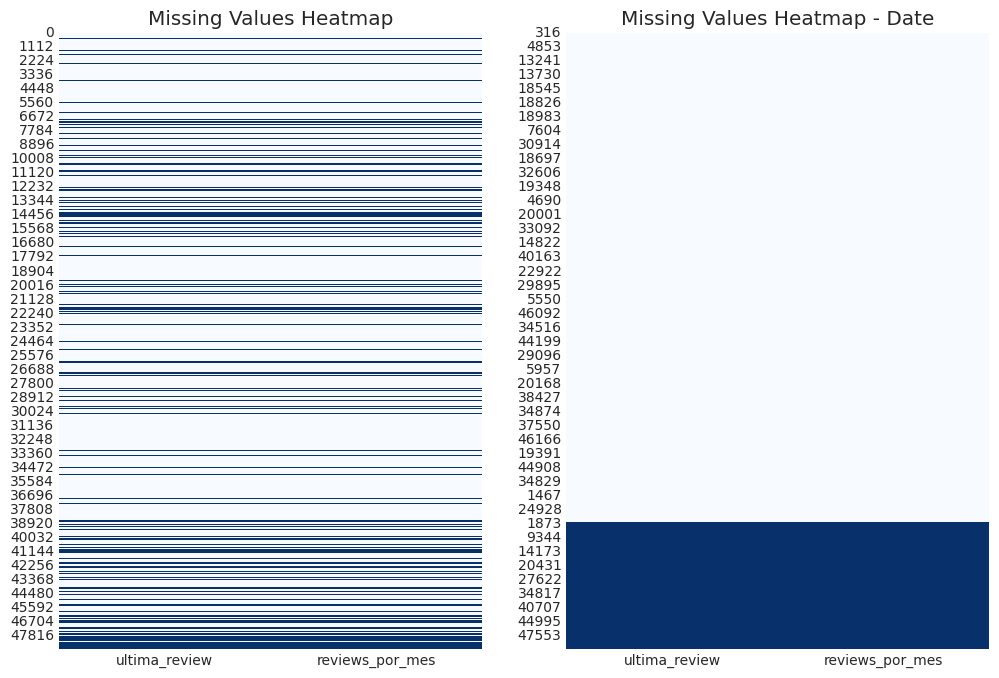

In [23]:
# avaliar melhor a distribuição dos ausentes em ultima_review" e reviews_por_mes

fig, ax = plt.subplots(1,2, figsize=(12, 8))

sns.heatmap(data_initial.loc[:, ['ultima_review', "reviews_por_mes"]].isnull(), cbar=False, cmap='Blues', ax=ax[0])
ax[0].set_title('Missing Values Heatmap')

sns.heatmap(data_initial.loc[:, ['ultima_review', "reviews_por_mes"]].sort_values('ultima_review', ascending = True).isnull(), cbar=False, cmap='Blues', ax=ax[1])
ax[1].set_title('Missing Values Heatmap - Date')

fig.show()

In [24]:
data_initial.loc[:, ['id', "ultima_review"]].head(10)

,id,ultima_review
0,2595,2019-05-21
1,3647,NaN
2,3831,2019-07-05
3,5022,2018-11-19
4,5099,2019-06-22
5,5121,2017-10-05
6,5178,2019-06-24
7,5203,2017-07-21
8,5238,2019-06-09
9,5295,2019-06-22


Conforme observado nos dados de `id` acima, as datas contidas na coluna `ultima_review` apresentam uma ausência não sequencial nos dados. Por não ser referente a um período ou ano específico, inviabiliza tentar criar um tipo de imputação para eles, mesmo que exista alguma correlação com os outros dados. Dessa forma, a maneira mais adequada para seguir seria excluindo essa coluna.
Já para os dados faltantes em `reviews_por_mes`, é preciso primeiro verificar se existe alguma correlação com os outros dados existentes antes de chegar a qualquer conclusão.

### Colunas 'nome' e 'host_name'

In [25]:
# Criar um dataframe auxiliar para identificar as linhas com valores faltantes em "nome" e "host_name"

data_null = data_initial.copy()

data_null.drop(["reviews_por_mes", "ultima_review"],axis = 1,inplace = True)

index_nulls = data_null[data_null.isnull().any(axis=1)].index.tolist()

data_null.loc[index_nulls]

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,calculado_host_listings_count,disponibilidade_365
359,100184,Bienvenue,526653,NaN,Queens,Queens Village,40.72413,-73.76133,Private room,50,1,43,1,88
2699,1449546,Cozy Studio in Flatbush,7779204,NaN,Brooklyn,Flatbush,40.64965,-73.96154,Entire home/apt,100,30,49,1,342
2853,1615764,NaN,6676776,Peter,Manhattan,Battery Park City,40.71239,-74.01620,Entire home/apt,400,1000,0,1,362
3702,2232600,NaN,11395220,Anna,Manhattan,East Village,40.73215,-73.98821,Entire home/apt,200,1,28,1,341
5744,4183989,SPRING in the City!! Zen-Style Tranquil Bedroom,919218,NaN,Manhattan,Harlem,40.80606,-73.95061,Private room,86,3,34,1,359
5774,4209595,NaN,20700823,Jesse,Manhattan,Greenwich Village,40.73473,-73.99244,Entire home/apt,225,1,1,1,0
5974,4370230,NaN,22686810,Michaël,Manhattan,Nolita,40.72046,-73.99550,Entire home/apt,215,7,5,1,0
6074,4446862,Charming Room in Prospect Heights!,23077718,NaN,Brooklyn,Crown Heights,40.67512,-73.96146,Private room,50,1,0,1,0
6268,4581788,NaN,21600904,Lucie,Brooklyn,Williamsburg,40.71370,-73.94378,Private room,150,1,0,1,0
6566,4756856,NaN,1832442,Carolina,Brooklyn,Bushwick,40.70046,-73.92825,Private room,70,1,0,1,0


In [26]:
# Coluna "host_name":
  # A única forma de identificarmos os nomes dos proprietários é atráves do "host_id", caso eles tenham um segundo imóvel.

data_null.loc[index_nulls].where(data_null['calculado_host_listings_count'] > 1).dropna(how = "all")

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,calculado_host_listings_count,disponibilidade_365
8162,6292866.0,Modern Quiet Gem Near All,32722063.0,NaN,Brooklyn,East Flatbush,40.65263,-73.93215,Entire home/apt,85.0,2.0,182.0,2.0,318.0
8851,6786181.0,R&S Modern Spacious Hideaway,32722063.0,NaN,Brooklyn,East Flatbush,40.64345,-73.93643,Entire home/apt,100.0,2.0,157.0,2.0,342.0
12823,9787590.0,NaN,50448556.0,Miguel,Manhattan,Harlem,40.80316,-73.95189,Entire home/apt,300.0,5.0,0.0,5.0,0.0
15818,12797684.0,NaN,69715276.0,Yan,Manhattan,Upper West Side,40.79843,-73.96404,Private room,100.0,1.0,0.0,2.0,0.0
27961,21867710.0,Amazing room in the centre on Manhatten! Welcome!,159156636.0,NaN,Manhattan,Hell's Kitchen,40.75668,-73.99097,Private room,120.0,1.0,89.0,3.0,0.0
28041,21901156.0,Best Deal! Lovely place in Manhattan! Time Squ...,159156636.0,NaN,Manhattan,Hell's Kitchen,40.75656,-73.99063,Private room,120.0,1.0,109.0,3.0,0.0
28273,21990808.0,***SLEEPING IN THE GOLDEN PLACE***,159156636.0,NaN,Manhattan,Hell's Kitchen,40.75835,-73.99065,Private room,120.0,1.0,88.0,3.0,0.0


Não foi possível identificar os proprietários com mais de um imóvel e com valores nulos da coluna `host_name`, pois seus outros imóveis também não contém essa informação. Por se tratar de uma informação categórica que não vai influenciar no modelo de precificação seguiremos sem esse preenchimento/imputação.

Já para a coluna `nome`, acredito que a forma mais adequada de preencher os nomes dos anuncios faltantes seja atráves das palavras mais repetidas dos anuncios agrupados de `room_type` do respectivo `bairro_group`.
Isso representa como as pessoas mais descrevem seus quartos compartilhados, quartos privativos ou apartamentos inteiros dentro do contexto de cada bairro.
Essa análise pode ser feita após os tratamentos, pois não há como afirmar que os nomes dos anuncios interferem nos valores de `price`

## Dados zerados

In [27]:
# Identificando dados zerados

data_zeros = data_initial.copy()
(data_zeros == 0).sum()

,0
id,0
nome,0
host_id,0
host_name,0
bairro_group,0
bairro,0
latitude,0
longitude,0
room_type,0
price,11


### Coluna 'price'

In [28]:
data_zeros.where(data_initial["price"] == 0).dropna(how = "all")

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
23160,18750597.0,"Huge Brooklyn Brownstone Living, Close to it all.",8993084.0,Kimberly,Brooklyn,Bedford-Stuyvesant,40.69023,-73.95428,Private room,0.0,4.0,1.0,2018-01-06,0.05,4.0,28.0
25432,20333471.0,★Hostel Style Room | Ideal Traveling Buddies★,131697576.0,Anisha,Bronx,East Morrisania,40.83296,-73.88668,Private room,0.0,2.0,55.0,2019-06-24,2.56,4.0,127.0
25633,20523843.0,"MARTIAL LOFT 3: REDEMPTION (upstairs, 2nd room)",15787004.0,Martial Loft,Brooklyn,Bushwick,40.69467,-73.92433,Private room,0.0,2.0,16.0,2019-05-18,0.71,5.0,0.0
25752,20608117.0,"Sunny, Quiet Room in Greenpoint",1641537.0,Lauren,Brooklyn,Greenpoint,40.72462,-73.94072,Private room,0.0,2.0,12.0,2017-10-27,0.53,2.0,0.0
25777,20624541.0,Modern apartment in the heart of Williamsburg,10132166.0,Aymeric,Brooklyn,Williamsburg,40.70838,-73.94645,Entire home/apt,0.0,5.0,3.0,2018-01-02,0.15,1.0,73.0
25793,20639628.0,Spacious comfortable master bedroom with nice ...,86327101.0,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68173,-73.91342,Private room,0.0,1.0,93.0,2019-06-15,4.28,6.0,176.0
25794,20639792.0,Contemporary bedroom in brownstone with nice view,86327101.0,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68279,-73.91170,Private room,0.0,1.0,95.0,2019-06-21,4.37,6.0,232.0
25795,20639914.0,Cozy yet spacious private brownstone bedroom,86327101.0,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68258,-73.91284,Private room,0.0,1.0,95.0,2019-06-23,4.35,6.0,222.0
26258,20933849.0,the best you can find,13709292.0,Qiuchi,Manhattan,Murray Hill,40.75091,-73.97597,Entire home/apt,0.0,3.0,0.0,NaN,NaN,1.0,0.0
26840,21291569.0,Coliving in Brooklyn! Modern design / Shared room,101970559.0,Sergii,Brooklyn,Bushwick,40.69211,-73.90670,Shared room,0.0,30.0,2.0,2019-06-22,0.11,6.0,333.0


In [29]:
# Por se tratar do nosso objetivo principal, é necessário excluir esses dados inicialmente, mas é possível armazenar esses IDs para testar o algoritmo final

index_zeros = data_zeros.where(data_initial["price"] == 0).dropna(how = "all").index.tolist()
index_zeros

[23160, 25432, 25633, 25752, 25777, 25793, 25794, 25795, 26258, 26840, 26865]

### Coluna 'numero_de_reviews' e 'disponibilidade_365'

In [30]:
# Identificando quanta linhas contém ao menos um valor nulo entre disponibilidade e número de reviews
data_zeros.where((data_initial["numero_de_reviews"] == 0) | (data_initial["disponibilidade_365"] == 0)).dropna(how = "all").count()

,0
id,22740
nome,22726
host_id,22740
host_name,22726
bairro_group,22740
bairro,22740
latitude,22740
longitude,22740
room_type,22740
price,22740


Semelhante à coluna `reviews_por_mes`, é preciso primeiro verificar se existe alguma correlação usando as linhas com dados existentes, apesar do zero poder realmente significar algo nesses casos.
Em reviews pode significar um apartamento/quarto novo que ainda não foi alugado ou um locatário que não se incomoda muito com as reviews dos clientes.
Já em disponibilidade, podemos pensar em apartamentos/quartos reservados até o fim dos respectivos anos ou alugados para uma mesma pessoa por períodos maiores e não convencionais para locais de temporada.

## Outliers

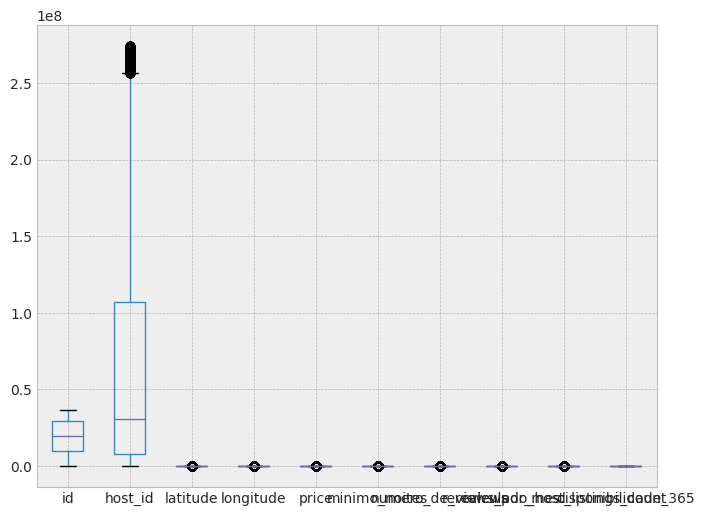

In [31]:
#boxplot inicial

data_initial.boxplot(figsize = (8,6))
plt.show()

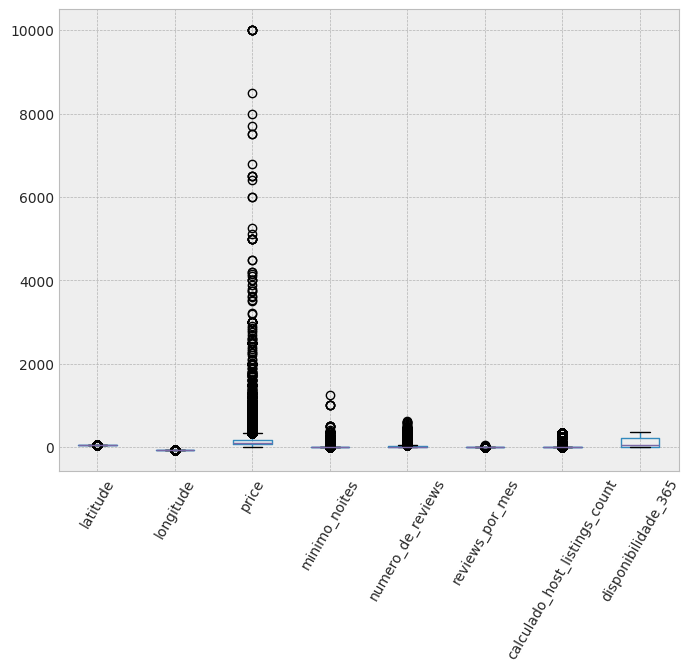

In [32]:
# Criando um dataframe auxiliar para plotar melhor o gráfico removendo colunas host_id, id

data_box = data_initial.copy()
data_box.drop(["host_id", "id"],axis = 1,inplace = True)

data_box.boxplot(figsize = (8,6))
plt.xticks(rotation = 60)
plt.show()

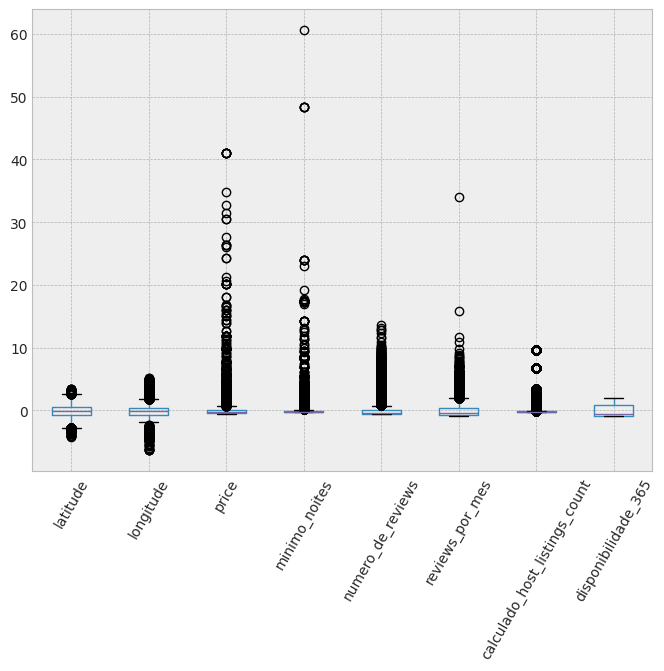

In [33]:
# A escala ainda não favoreceu a visualização. Retirando os dados de objetos para aprimorá-la mais.

data_box.drop(["nome", "host_name", "bairro", "bairro_group", "room_type", "ultima_review"],axis = 1,inplace = True)

data_box.apply(scale).boxplot(figsize = (8,6))
plt.xticks(rotation = 60)
plt.show()

Ainda está nítida a disparidade na quantidade de outliers e será necessário avaliar alguns itens mais detalhadamente

### Coluna 'price' e 'minimo_noites'

In [34]:
# price

data_initial.sort_values("price", ascending = False).head(10)

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
9150,7003697,Furnished room in Astoria apartment,20582832,Kathrine,Queens,Astoria,40.76810,-73.91651,Private room,10000,100,2,2016-02-13,0.04,1,0
29237,22436899,1-BR Lincoln Center,72390391,Jelena,Manhattan,Upper West Side,40.77213,-73.98665,Entire home/apt,10000,30,0,NaN,NaN,1,83
17691,13894339,Luxury 1 bedroom apt. -stunning Manhattan views,5143901,Erin,Brooklyn,Greenpoint,40.73260,-73.95739,Entire home/apt,10000,5,5,2017-07-27,0.16,1,0
12341,9528920,"Quiet, Clean, Lit @ LES & Chinatown",3906464,Amy,Manhattan,Lower East Side,40.71355,-73.98507,Private room,9999,99,6,2016-01-01,0.14,1,83
40432,31340283,2br - The Heart of NYC: Manhattans Lower East ...,4382127,Matt,Manhattan,Lower East Side,40.71980,-73.98566,Entire home/apt,9999,30,0,NaN,NaN,1,365
6529,4737930,Spanish Harlem Apt,1235070,Olson,Manhattan,East Harlem,40.79264,-73.93898,Entire home/apt,9999,5,1,2015-01-02,0.02,1,0
30267,23377410,Beautiful/Spacious 1 bed luxury flat-TriBeCa/Soho,18128455,Rum,Manhattan,Tribeca,40.72197,-74.00633,Entire home/apt,8500,30,2,2018-09-18,0.18,1,251
4376,2953058,Film Location,1177497,Jessica,Brooklyn,Clinton Hill,40.69137,-73.96723,Entire home/apt,8000,1,1,2016-09-15,0.03,11,365
29661,22779726,East 72nd Townhouse by (Hidden by Airbnb),156158778,Sally,Manhattan,Upper East Side,40.76824,-73.95989,Entire home/apt,7703,1,0,NaN,NaN,12,146
45665,34895693,Gem of east Flatbush,262534951,Sandra,Brooklyn,East Flatbush,40.65724,-73.92450,Private room,7500,1,8,2019-07-07,6.15,2,179


In [35]:
# price e ninimo_noites em conjunto

data_initial.where((data_initial["price"] > np.mean(data_initial["price"])) & (data_initial["minimo_noites"] > np.mean(data_initial["minimo_noites"]))).dropna(how = "all")

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
28,9657.0,Modern 1 BR / NYC / EAST VILLAGE,21904.0,Dana,Manhattan,East Village,40.72920,-73.98542,Entire home/apt,180.0,14.0,29.0,2019-04-19,0.24,1.0,67.0
58,15341.0,**Bright Nolita Apt w Doorman/Elevators/Gym**,60049.0,Ted,Manhattan,SoHo,40.72210,-73.99775,Entire home/apt,180.0,30.0,21.0,2019-06-29,0.30,1.0,154.0
60,15396.0,Sunny & Spacious Chelsea Apartment,60278.0,Petra,Manhattan,Chelsea,40.74623,-73.99530,Entire home/apt,375.0,180.0,5.0,2018-11-03,0.12,1.0,180.0
62,16326.0,Comfortable 4-bedroom apt in family house.,63588.0,Dimitri,Brooklyn,Prospect Heights,40.67811,-73.96428,Entire home/apt,200.0,30.0,143.0,2019-01-26,1.33,2.0,297.0
70,17037.0,Lovely EV Artist's Home,66035.0,Anna,Manhattan,East Village,40.72162,-73.98008,Entire home/apt,230.0,9.0,49.0,2018-05-14,0.43,1.0,116.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48743,36415840.0,A BEAUTIFUL SPACE IN HEART OF WILLIAMSBURG,223715460.0,Simon And Julian,Brooklyn,Williamsburg,40.71091,-73.96560,Entire home/apt,499.0,30.0,0.0,NaN,NaN,1.0,365.0
48762,36421390.0,House feeling in Caroll Garden,3827238.0,Tarek,Brooklyn,Carroll Gardens,40.67666,-73.99981,Entire home/apt,170.0,30.0,0.0,NaN,NaN,1.0,64.0
48783,36426319.0,"Duplex penthouse with terrace, prime UES location",46876102.0,Philippe,Manhattan,Upper East Side,40.77840,-73.95670,Entire home/apt,250.0,45.0,0.0,NaN,NaN,1.0,83.0
48793,36428255.0,Skyscraper Ultimate Luxury at the Heart of BKLYN.,148289089.0,Elmar,Brooklyn,Boerum Hill,40.68780,-73.98145,Entire home/apt,235.0,10.0,0.0,NaN,NaN,1.0,64.0


In [36]:
# minimo_noites

data_initial.sort_values("minimo_noites", ascending = False).head(10)

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
5766,4204302,Prime W. Village location 1 bdrm,17550546,Genevieve,Manhattan,Greenwich Village,40.73293,-73.99782,Entire home/apt,180,1250,2,2014-11-09,0.03,1,365
2853,1615764,NaN,6676776,Peter,Manhattan,Battery Park City,40.71239,-74.01620,Entire home/apt,400,1000,0,NaN,NaN,1,362
26340,20990053,Beautiful place in Brooklyn! #2,151084261,Angie,Brooklyn,Williamsburg,40.71772,-73.95059,Private room,79,999,24,2018-06-28,1.12,6,249
38663,30378211,Shared Studio (females only),200401254,Meg,Manhattan,Greenwich Village,40.73094,-73.99900,Shared room,110,999,0,NaN,NaN,1,365
13403,10053943,Historic Designer 2 Bed. Apartment,2697686,Glenn H.,Manhattan,Harlem,40.82915,-73.94034,Entire home/apt,99,999,2,2018-01-04,0.07,1,42
11192,8668115,Zen Room in Crown Heights Brooklyn,8996336,Laura,Brooklyn,Crown Heights,40.67255,-73.94914,Private room,50,500,10,2016-09-22,0.22,1,365
47619,35834935,Williamsburg Apartment,82674375,Meg,Brooklyn,Williamsburg,40.70898,-73.94885,Entire home/apt,140,500,0,NaN,NaN,1,331
8013,6169897,Wonderful Large 1 bedroom,10720264,John,Manhattan,Harlem,40.82135,-73.95521,Entire home/apt,75,500,0,NaN,NaN,1,362
7354,5431845,Beautiful Fully Furnished 1 bed/bth,3680008,Aliya,Queens,Long Island City,40.75104,-73.93863,Entire home/apt,134,500,30,2018-06-24,0.57,1,90
14284,11096888,Peaceful apartment close to F/G,2228137,Amanda,Brooklyn,Kensington,40.64779,-73.97956,Private room,45,500,0,NaN,NaN,1,358


In [37]:
# minimo_noites

data_initial.where(data_initial["minimo_noites"] > 30).dropna(how = "all")

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
5,5121.0,BlissArtsSpace!,7356.0,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60.0,45.0,49.0,2017-10-05,0.40,1.0,0.0
13,6090.0,West Village Nest - Superhost,11975.0,Alina,Manhattan,West Village,40.73530,-74.00525,Entire home/apt,120.0,90.0,27.0,2018-10-31,0.22,1.0,0.0
35,11452.0,Clean and Quiet in Brooklyn,7355.0,Vt,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,Private room,35.0,60.0,0.0,NaN,NaN,1.0,365.0
60,15396.0,Sunny & Spacious Chelsea Apartment,60278.0,Petra,Manhattan,Chelsea,40.74623,-73.99530,Entire home/apt,375.0,180.0,5.0,2018-11-03,0.12,1.0,180.0
80,19159.0,Spacious luminous apt Upper West NYC,73051.0,Sybilla,Manhattan,Harlem,40.82915,-73.95136,Entire home/apt,110.0,31.0,54.0,2019-03-23,0.49,1.0,209.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48324,36204103.0,$2000 / Huge 1br - Cobble Hill | 8/1 start,95054582.0,Saba,Brooklyn,Cobble Hill,40.68719,-73.99515,Private room,70.0,60.0,0.0,NaN,NaN,1.0,156.0
48367,36224509.0,HUGE BEDROOM WITH PATIO ON HISTORIC LENOX AVE!!!,735287.0,Taprena,Manhattan,Harlem,40.81458,-73.93696,Private room,150.0,60.0,0.0,NaN,NaN,1.0,215.0
48445,36270376.0,"Beautiful home on Staten Island, walk to ferry",444904.0,Janine,Staten Island,St. George,40.64005,-74.07987,Entire home/apt,100.0,365.0,0.0,NaN,NaN,1.0,342.0
48751,36417926.0,Room in Beautiful Duplex 4BR 2BA Nostrand av (...,272504878.0,Lana,Brooklyn,Bedford-Stuyvesant,40.67905,-73.95014,Private room,45.0,32.0,0.0,NaN,NaN,1.0,85.0


### Colunas 'calculado_host_list_count', 'latitude' e 'longitude'

In [38]:
# calculado_host_listings_count

data_initial.sort_values("calculado_host_listings_count", ascending = False).head(10)

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
44178,34087749,Sonder | 116 John | Laid-Back Studio + Gym,219517861,Sonder (NYC),Manhattan,Financial District,40.70803,-74.00639,Entire home/apt,100,29,0,NaN,NaN,327,325
41430,32238473,Sonder | Stock Exchange | Sleek Studio + Kitchen,219517861,Sonder (NYC),Manhattan,Financial District,40.70581,-74.01226,Entire home/apt,241,2,5,2019-06-12,1.35,327,284
41428,32238391,Sonder | Stock Exchange | Lively 1BR + Lounge,219517861,Sonder (NYC),Manhattan,Financial District,40.70569,-74.01077,Entire home/apt,227,2,8,2019-06-11,3.64,327,349
41427,32238387,Sonder | Stock Exchange | Central 1BR + Sofa Bed,219517861,Sonder (NYC),Manhattan,Financial District,40.70766,-74.01114,Entire home/apt,244,2,1,2019-05-27,0.70,327,258
41426,32238324,Sonder | Stock Exchange | Chic 1BR + Laundry,219517861,Sonder (NYC),Manhattan,Financial District,40.70621,-74.01054,Entire home/apt,229,2,5,2019-05-21,1.25,327,335
41425,32238307,Sonder | Stock Exchange | Classic Studio + Lau...,219517861,Sonder (NYC),Manhattan,Financial District,40.70574,-74.01023,Entire home/apt,201,2,20,2019-06-21,4.11,327,333
41424,32238253,Sonder | Stock Exchange | Airy 1BR + Lounge,219517861,Sonder (NYC),Manhattan,Financial District,40.70569,-74.01183,Entire home/apt,234,2,8,2019-06-18,2.31,327,333
41423,32238229,Sonder | Stock Exchange | Warm Studio + Kitchen,219517861,Sonder (NYC),Manhattan,Financial District,40.70584,-74.01045,Entire home/apt,185,2,6,2019-05-26,1.58,327,295
41422,32238198,Sonder | Stock Exchange | Chic 1BR + Sofa Bed,219517861,Sonder (NYC),Manhattan,Financial District,40.70782,-74.01066,Entire home/apt,229,2,9,2019-05-13,2.11,327,346
41421,32238131,Sonder | Stock Exchange | Simple 1BR + Sofa Bed,219517861,Sonder (NYC),Manhattan,Financial District,40.70731,-74.01056,Entire home/apt,214,2,11,2019-06-11,3.20,327,312


In [39]:
# Verificando o número de entradas de hosts com mais de um imóvel

host_imoveis = data_initial.where(data_initial["calculado_host_listings_count"] > 1).dropna(how = "all")
host_imoveis

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,2595.0,Skylit Midtown Castle,2845.0,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225.0,1.0,45.0,2019-05-21,0.38,2.0,355.0
8,5238.0,Cute & Cozy Lower East Side 1 bdrm,7549.0,Ben,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150.0,1.0,160.0,2019-06-09,1.33,4.0,188.0
11,5803.0,"Lovely Room 1, Garden, Best Area, Legal rental",9744.0,Laurie,Brooklyn,South Slope,40.66829,-73.98779,Private room,89.0,4.0,167.0,2019-06-24,1.34,3.0,314.0
18,7750.0,Huge 2 BR Upper East Cental Park,17985.0,Sing,Manhattan,East Harlem,40.79685,-73.94872,Entire home/apt,190.0,7.0,0.0,NaN,NaN,2.0,249.0
20,8024.0,CBG CtyBGd HelpsHaiti rm#1:1-4,22486.0,Lisel,Brooklyn,Park Slope,40.68069,-73.97706,Private room,130.0,2.0,130.0,2019-07-01,1.09,6.0,347.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48886,36483152.0,Garden Jewel Apartment in Williamsburg New York,208514239.0,Melki,Brooklyn,Williamsburg,40.71232,-73.94220,Entire home/apt,170.0,1.0,0.0,NaN,NaN,3.0,365.0
48888,36484363.0,QUIT PRIVATE HOUSE,107716952.0,Michael,Queens,Jamaica,40.69137,-73.80844,Private room,65.0,1.0,0.0,NaN,NaN,2.0,163.0
48889,36484665.0,Charming one bedroom - newly renovated rowhouse,8232441.0,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70.0,2.0,0.0,NaN,NaN,2.0,9.0
48890,36485057.0,Affordable room in Bushwick/East Williamsburg,6570630.0,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40.0,4.0,0.0,NaN,NaN,2.0,36.0


In [40]:
# Verificando se existem imóveis duplicados com anuncios diferentes que não foram detectados na análise de duplicados anteriormente

duplicated_imoveis = host_imoveis[host_imoveis.duplicated(subset=['latitude', 'longitude'], keep=False)]
duplicated_imoveis.sort_values("latitude", ascending = False).groupby("host_name").count()

,id,nome,host_id,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
host_name,,,,,,,,,,,,,,,
Chayla,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
Gary,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
Howard,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
Ivy,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
John,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
Jose,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
Leon,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
Mathieu,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
Melki,3,3,3,3,3,3,3,3,3,3,3,1,1,3,3


In [41]:
# Analisando o proprietário com anuncios diversos no mesmo local

duplicated_imoveis.where(duplicated_imoveis["host_name"] == 'Melki').dropna(how = "all")

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
48390,36235150.0,Sky View beautiful apt in Williamsburg New York,208514239.0,Melki,Brooklyn,Williamsburg,40.71232,-73.9422,Entire home/apt,170.0,1.0,1.0,2019-07-07,1.0,3.0,340.0
48879,36481315.0,The Raccoon Artist Studio in Williamsburg New ...,208514239.0,Melki,Brooklyn,Williamsburg,40.71232,-73.9422,Entire home/apt,120.0,1.0,0.0,NaN,NaN,3.0,365.0
48886,36483152.0,Garden Jewel Apartment in Williamsburg New York,208514239.0,Melki,Brooklyn,Williamsburg,40.71232,-73.9422,Entire home/apt,170.0,1.0,0.0,NaN,NaN,3.0,365.0


Apesar da host Melki conter 3 anuncios no mesmo local, não é possível afirmar se tratar do mesmo imóvel, pois eles contém dados diferentes referentes a reviews e preços. Dessa forma, os dados serão mantidos como três imóveis diferentes.

Com exceção da coluna `disponibilidade_365`, há uma série de outliers presentes no banco de dados. As possíveis causas para essa discrepancia são:

*   **Latitude e Longitude:** Por estarmos lidando com um banco de dados que abrange todos os cinco distritos de Nova Iorque é natural que exista essa presença de outliers pelas distancias entre os bairros e concentração de imóveis em cada local.

*   **Preço**: Foi possivel perceber que diversos dados podem ter sido imputados com valores referentes ao tempo total de locação ao invés de dia.

*   **Mínimo noites**: Semelhante ao caso de da coluna price, existem locais com locações de longa duração.

* **Número de reviews e reviews por mês**: ambas colunas contém dados numericos e o número de outliers pode ser justificada em uma por conter diversos valores nulos e na outra por conter diversos valores zerados.

* **Contagem de locais por pessoa**: foi possível verificar que existem empresas no meio dos host, então os outliers podem ser justificados.

Dessa forma, a ideia será aplicar uma padronização por Z-score para não perder tantos dados.

## Conclusões iniciais e ordem de tratamento os dados

Diante de tudo observado, é possível tirar algumas conclusões e definir a ordem em que os dados serão tratados para melhor aproveitamento do algoritmo.

*   As colunas `id`, `host_name`, `host_id` e `ultima_review` podem ser excluídas de imediato.

*   As colunas `latitude`/`longitude` (33.182 dados), `bairro` (221 dados) e `bairro_group` (5 dados) determinam a localização do imóvel. Pensando na otimização do algoritmo, faz sentido usar apenas uma dessas três para analisarmos essa característica. Nesse caso, de imediato, recomenda-se a exclusão das duas primeira colunas e comparar posteriormente bairros e distritos para definir qual vai tornar o algorimo mais eficiente.

*   A coluna `minimo_noites` deve ser a primeira filtrada para retirar dados antes mesmo de aplicarmos o Z-score. Por se tratar de um algorítimo de algueis de **temporada** devemos levar em consideração o que foi definido e assinado no Projeto de Lei A4130C* do estado de Nova Iorque, que entra em vigor em março de 2025. Entre outras regulações sobre alugueis de temporada na cidade, ela define que imóveis para esse fim não podem ser locados por 30 ou mais dias consecutivos.

*   Aplicar Z-score para retirar os outliers de `price` e também os valores zerados identificados anteriormente.

*   Fazer um filtro para observar se há influência/padrão de `nome` nos preços mais elevados. Guardar essas informações e depois retirar a coluna inteira também.

*   Enumerar as variaveis categoricas restante, no caso `bairro`, `bairro_group` e `room_type`.

*   Gerar uma matrizes de correlação para entender as relações entre todos os itens e definir sobre a exclusão ou imputação dos outros dados em `numero_de_reviews`, `reviews_por_mes`, `calculado_host_listings_count` e `disponibilidade_365`

*https://shorturl.at/m26Pi






# TRATAMENTO DOS DADOS

Com as informações adquiridas anteriormente, podemos iniciar o tratamento dos dados.

In [42]:
# Criação de novo dataframe e exclusão das colunas que não vão afetar a análise
data_new = data_initial.copy()
data_new.drop(["id", "host_id", "host_name", "ultima_review", 'latitude', 'longitude'], axis=1, inplace=True)

# filtrar pelo máximo de noites permitido e retirar os preços zerados
data_new = data_new[(data_new.minimo_noites > 0) & (data_new.minimo_noites < 30) & (data_new.price > 0)]

In [43]:
# retirar também a primeira amostra do dataset, que contém um dos valores que serão usados para teste posteriormente
data_new = data_new.drop(index = 0)
data_new

,nome,bairro_group,bairro,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
1,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Harlem,Private room,150,3,0,NaN,1,365
2,Cozy Entire Floor of Brownstone,Brooklyn,Clinton Hill,Entire home/apt,89,1,270,4.64,1,194
3,Entire Apt: Spacious Studio/Loft by central park,Manhattan,East Harlem,Entire home/apt,80,10,9,0.10,1,0
4,Large Cozy 1 BR Apartment In Midtown East,Manhattan,Murray Hill,Entire home/apt,200,3,74,0.59,1,129
6,Large Furnished Room Near B'way,Manhattan,Hell's Kitchen,Private room,79,2,430,3.47,1,220
...,...,...,...,...,...,...,...,...,...,...
48889,Charming one bedroom - newly renovated rowhouse,Brooklyn,Bedford-Stuyvesant,Private room,70,2,0,NaN,2,9
48890,Affordable room in Bushwick/East Williamsburg,Brooklyn,Bushwick,Private room,40,4,0,NaN,2,36
48891,Sunny Studio at Historical Neighborhood,Manhattan,Harlem,Entire home/apt,115,10,0,NaN,1,27
48892,43rd St. Time Square-cozy single bed,Manhattan,Hell's Kitchen,Shared room,55,1,0,NaN,6,2


In [44]:
# reiniciar o index para ordenar os dados de uma forma melhor
data_new.reset_index(drop=True, inplace=True)
# Criar um filtro para trabalhar com dados numéricos
num_columns = data_new.select_dtypes(exclude='object').columns

data_new

,nome,bairro_group,bairro,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Harlem,Private room,150,3,0,NaN,1,365
1,Cozy Entire Floor of Brownstone,Brooklyn,Clinton Hill,Entire home/apt,89,1,270,4.64,1,194
2,Entire Apt: Spacious Studio/Loft by central park,Manhattan,East Harlem,Entire home/apt,80,10,9,0.10,1,0
3,Large Cozy 1 BR Apartment In Midtown East,Manhattan,Murray Hill,Entire home/apt,200,3,74,0.59,1,129
4,Large Furnished Room Near B'way,Manhattan,Hell's Kitchen,Private room,79,2,430,3.47,1,220
...,...,...,...,...,...,...,...,...,...,...
44372,Charming one bedroom - newly renovated rowhouse,Brooklyn,Bedford-Stuyvesant,Private room,70,2,0,NaN,2,9
44373,Affordable room in Bushwick/East Williamsburg,Brooklyn,Bushwick,Private room,40,4,0,NaN,2,36
44374,Sunny Studio at Historical Neighborhood,Manhattan,Harlem,Entire home/apt,115,10,0,NaN,1,27
44375,43rd St. Time Square-cozy single bed,Manhattan,Hell's Kitchen,Shared room,55,1,0,NaN,6,2


Inclusão dos dados médios de reviews_por_mes para substituir os valores nulos da coluna.

In [45]:
# correlação atual dos dados
data_new[num_columns].corr()

,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
price,1.000000,-0.000661,-0.049713,-0.030489,0.048663,0.082104
minimo_noites,-0.000661,1.000000,-0.121099,-0.209055,0.244368,0.018409
numero_de_reviews,-0.049713,-0.121099,1.000000,0.543555,-0.040952,0.226567
reviews_por_mes,-0.030489,-0.209055,0.543555,1.000000,0.025837,0.234836
calculado_host_listings_count,0.048663,0.244368,-0.040952,0.025837,1.000000,0.171903
disponibilidade_365,0.082104,0.018409,0.226567,0.234836,0.171903,1.000000


In [46]:
# imputar os dados médios na coluna alvo

data_new['reviews_por_mes'] = data_new['reviews_por_mes'].fillna(data_new['reviews_por_mes'].mean())

In [47]:
# Nova correlação
data_new[num_columns].corr()

,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
price,1.000000,-0.000661,-0.049713,-0.022920,0.048663,0.082104
minimo_noites,-0.000661,1.000000,-0.121099,-0.163874,0.244368,0.018409
numero_de_reviews,-0.049713,-0.121099,1.000000,0.525051,-0.040952,0.226567
reviews_por_mes,-0.022920,-0.163874,0.525051,1.000000,0.020475,0.211714
calculado_host_listings_count,0.048663,0.244368,-0.040952,0.020475,1.000000,0.171903
disponibilidade_365,0.082104,0.018409,0.226567,0.211714,0.171903,1.000000


Houve uma mudança leve, porém considerável. Diante disso é possível continuar com esse novo dataset.

## Exclusão de outliers

In [48]:
# Aplicar Z-score para padronizar e retirar os outliers em price

scaler = StandardScaler()
data_new["price_new"] = scaler.fit_transform(data_new[["price"]])
data_new = data_new[data_new["price_new"] < 3]
data_new = data_new[data_new["price_new"] > -3]

In [49]:
# Resetar o index mais uma vez para ordenar os dados
data_new.reset_index(drop=True, inplace=True)
data_new

,nome,bairro_group,bairro,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,price_new
0,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Harlem,Private room,150,3,0,1.439128,1,365,0.005864
1,Cozy Entire Floor of Brownstone,Brooklyn,Clinton Hill,Entire home/apt,89,1,270,4.640000,1,194,-0.285294
2,Entire Apt: Spacious Studio/Loft by central park,Manhattan,East Harlem,Entire home/apt,80,10,9,0.100000,1,0,-0.328251
3,Large Cozy 1 BR Apartment In Midtown East,Manhattan,Murray Hill,Entire home/apt,200,3,74,0.590000,1,129,0.244517
4,Large Furnished Room Near B'way,Manhattan,Hell's Kitchen,Private room,79,2,430,3.470000,1,220,-0.333024
...,...,...,...,...,...,...,...,...,...,...,...
43941,Charming one bedroom - newly renovated rowhouse,Brooklyn,Bedford-Stuyvesant,Private room,70,2,0,1.439128,2,9,-0.375982
43942,Affordable room in Bushwick/East Williamsburg,Brooklyn,Bushwick,Private room,40,4,0,1.439128,2,36,-0.519174
43943,Sunny Studio at Historical Neighborhood,Manhattan,Harlem,Entire home/apt,115,10,0,1.439128,1,27,-0.161194
43944,43rd St. Time Square-cozy single bed,Manhattan,Hell's Kitchen,Shared room,55,1,0,1.439128,6,2,-0.447578


In [50]:
# Perdemos pouco mais de 10% dos dados apenas

data_new.shape[0] / data_initial.shape[0] * 100

89.88014889352478

In [51]:
# Retirando a coluna de price criada

data_new.drop('price_new', axis = 1, inplace = True)

## Filtro nomes

Buscar correlações entre os nomes dos anuncios e os valores

In [52]:
# criar um dataframe auxiliar só com os dados alvo, agrupar por bairro_group e room_type e visualizar os top 10 mais caros

name_filter_top20 = data_new.groupby(["bairro_group", "room_type"])[['nome', 'bairro_group', 'room_type', 'price']].apply(lambda x: x.nlargest(20, 'price')).dropna(how = "any")
pd.options.display.max_rows = 300
pd.options.display.max_colwidth = 300

name_filter_top20

nome  \
bairro_group  room_type                                                                    
Bronx         Entire home/apt 34850                                 SedaOn2 Dance Studio   
                              43414             ROMANTIC SUNSET YACHT CRUISE & FIREWORKS   
                              14955      Quiet, Secure, Clean and very Private Apartment   
                              31417   Vie's NY Unique crashpad apts sleep 14, metro*wifi   
                              6247    Modern/Spacious 4BR +Tent Perfect for LARGE groups   
                              13916                                     ★ HEBREWS 13:2 ★   
                              23375                                         Summer vibes   
                              16376                  La Dolce Vita Apartment in Garfield   
                              29032     2 Bedroom 1 Bath by NYC Train and Major Highways   
                              43226                                        The Game Room   
                              43590                                          Dream House   
                              27711     4 bdrm Riverdale apt, 15-30 minutes to Manhattan   
                              15293       NYC 2500 sq ft home near yankee stadium/subway   
                              21193                              Chic Clason Point Condo   
                              33789   ⚡ 3 APT in 1--Large groups Travel & stay together⚡   
                              9647                      Waterfront, perfect NYC getaway!   
                              40350     Use entire space 3 level home just redone 35%off   
                              42821     GRAND OPENING  3 levels tons of sunlights 25%off   
                              32549                                             The Spot   
                              17004     Dominiques NYC 4Bedrm crashpad**Stay here**metro   
              Private room    7598                       1 Room in a 2 Bedroom Available   
                              22939                                   Luxury and comfort   
                              13654                          Downtown style in the Bronx   
                              24005               Victorian styled long townhouse in NYC   
                              26481                                      Pelham Parkways   
                              33460                                           Sams place   
                              32880                                      Convenient stay   
                              26194                     Cozy bedroom in a share apartmet   
                              30031                                 Yankee baseball stay   
                              30033                                 YANKEE BASEBALL STAY   
                              26350                                    Bronx Norwood Apt   
                              41417     New Cozy Suite in Private home on quiet street .   
                              30484                     Spacious and close to everything   
                              30671                                     Anderson's abode   
                              38058           TW #6 Private Suite 2nd Fl.  1 to 4 Guests   
                              39549     Hang The World In Your Memory©   (SLEEPS 1 to 5)   
                              41999            FREE Private Parking, HOME AWAY FROM HOME   
                              34673            Luxury Apartment (1 Bedroom w/ twin beds)   
                              30415    *NYC Flat Cold Cozy Private Room w/ Blazin' WiFi*   
                              30418    Beautiful NYC Private Room/Bath, Late Check-In OK   
              Shared room     20067              South Bronx-Piano District artist Loft/   
                              9744                             Charming studio apartment   
                              22257 

In [53]:
name_filter_bottom20 = data_new.groupby(["bairro_group", "room_type"])[['nome', 'bairro_group', 'room_type', 'price']].apply(lambda x: x.nsmallest(20, 'price')).dropna(how = "any")
pd.options.display.max_rows = 300
pd.options.display.max_colwidth = 300

name_filter_bottom20

nome  \
bairro_group  room_type                                                                                  
Bronx         Entire home/apt 21211                                   Fully-furnished modern apartment   
                              38421                      Two Bedroom Apt 25 Min From Midtown Manhattan   
                              12450                             Studio Apartment in Safe Neighborhood.   
                              33037                                             Modern Sunny 3bdrm Apt   
                              23927                  Private and Cozy Studio  Pelham Gardens - Bx, NY.   
                              26768                                          Nice Place in The Bronx!!   
                              35440                            Spacious Bronx apartment near Bronx Zoo   
                              30641                                       Comfortable Studio Apartment   
                              36296                                                       Patty’s Home   
                              18467                                  River View Apartment in the Bronx   
                              1479                                  PRIVATE BATH/TONS OF SUNLIGHT/SAFE   
                              24598                                                      Peace of mind   
                              25467                                                     Bronx hideaway   
                              25649                                               South Bronx Hideaway   
                              39556                        Relaxing, comfy, and stress-free apartment.   
                              34060                     Entire floor (private entrance) w/ 1 BR in NYC   
                              43287                                                          Cozy warm   
                              22112                        Enormous apartment with everything you need   
                              23060                                   Pretty studio with lots of light   
                              41367                       Cozy 1 Bedroom Apartment near Yankee Stadium   
              Private room    31196                                                        Bronx Apart   
                              29798                   Simple Private Rm w/ Futon in the Bronx/ Storage   
                              15976                                                         Vida Local   
                              28453                            Private Clean Room near Yankee Stadium.   
                              34190                   private room for WOMEN ONLY near BX Little Italy   
                              38411                                                         Ysa's room   
                              24021                         Large Private Room In Spacious Guest House   
                              28261                                          Humble Abode in the Bronx   
                              35305                                                       Pelham south   
                              13568                                      Affordable Private Cozy Room!   
                              30504                                                Esteem's Place Deux   
                              32532                                        Bronx Apartment College Ave   
                              40027                 One little beautiful room in an 3bedroom apartment   
                              9823                        BEDROOM PRIVATE COMFY NEAR 6 TRAIN NO CURFEW   
                              23970                               Private Room w/ Queen Bed & Twin Bed   
                              32311                                                          BnB & Spa   
                              20103                                   

Fazendo uma análise nos 20 mais caros e nos 20 mais baratos de cada tipo de quarto em cada distrito, é possível perceber que existem alguns adjetivos e seus sinonimos que se repetem como *large* e *spacious*, *secure* e *safe*, *new/newly* e *modern*, *charming* e *beautiful*. Palavras específicas às descrições dos imóveis como *private*, o número de quartos (*bedrooms*) e se estão próximas ao metrô ou pontos turisticos (*near*) também aparecem frequentemente.

In [54]:
# Confirmando numericamente a análise anterior

text_top20 = " ".join(name_filter_top20['nome'])
text_bottom20 = " ".join(name_filter_bottom20['nome'])

words_top20 = re.findall(r'\b\w+\b', text_top20.lower())
words_bottom20 = re.findall(r'\b\w+\b', text_bottom20.lower())

num_words_top20 = Counter(words_top20)
num_words_bottom20 = Counter(words_bottom20)

top_words = num_words_top20.most_common(100)
bottom_words = num_words_bottom20.most_common(100)

a = pd.DataFrame(top_words, columns=['Word', 'Frequency'])
b = pd.DataFrame(bottom_words, columns=['Word', 'Frequency'])

merged_df = a.merge(b, on='Word', suffixes=('_top20', '_bottom20'))
merged_df.sort_values(by='Frequency_top20', ascending=False)

,Word,Frequency_top20,Frequency_bottom20
0,in,59,78
1,to,38,37
2,home,29,11
3,nyc,28,20
4,room,25,77
5,bedroom,23,23
6,private,21,47
7,manhattan,21,19
8,and,19,27
9,the,19,18


Nessa segunda análise é possível perceber que a única palavra de destaque para os anuncios mais caros em relação aos mais baratos é *home*. Por outro lado, o padrão de repetição das palavras nos anuncios mais mais baratos está vinculado principalmente a palavras como *room*, *private*, *studio*, *apartment* e *shared*. Isso se deve ao anuncio das características de `room_type` dos imóveis. Portanto, é possível afirmar que o padrão que existe nos anuncios é de acordo com o que o mesmo oferece, mas não há uma fórmula para ser seguida que afete diretamente o preço das estadias. Dessa forma, a coluna `nome` também será retirada da análise.

# IDENTIFICANDO PADRÕES

## Correlações

Agora que os dados já foram tratados, é possível iniciar a busca por correlações e os melhores modelos para utilizar na modelagem

In [55]:
# Criar uma cópia do dataframe para lidar com as variáveis numéricas e categóricas, retirar a coluna de nomes e um filtro para as categóricas também.

data_new.drop("nome", axis=1, inplace=True)
cat_columns = data_new.select_dtypes(exclude='number').columns

data_num = data_new[num_columns].copy().reset_index(drop=True)
data_cat = data_new[cat_columns].copy().reset_index(drop=True)

data_num

,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,150,3,0,1.439128,1,365
1,89,1,270,4.640000,1,194
2,80,10,9,0.100000,1,0
3,200,3,74,0.590000,1,129
4,79,2,430,3.470000,1,220
...,...,...,...,...,...,...
43941,70,2,0,1.439128,2,9
43942,40,4,0,1.439128,2,36
43943,115,10,0,1.439128,1,27
43944,55,1,0,1.439128,6,2


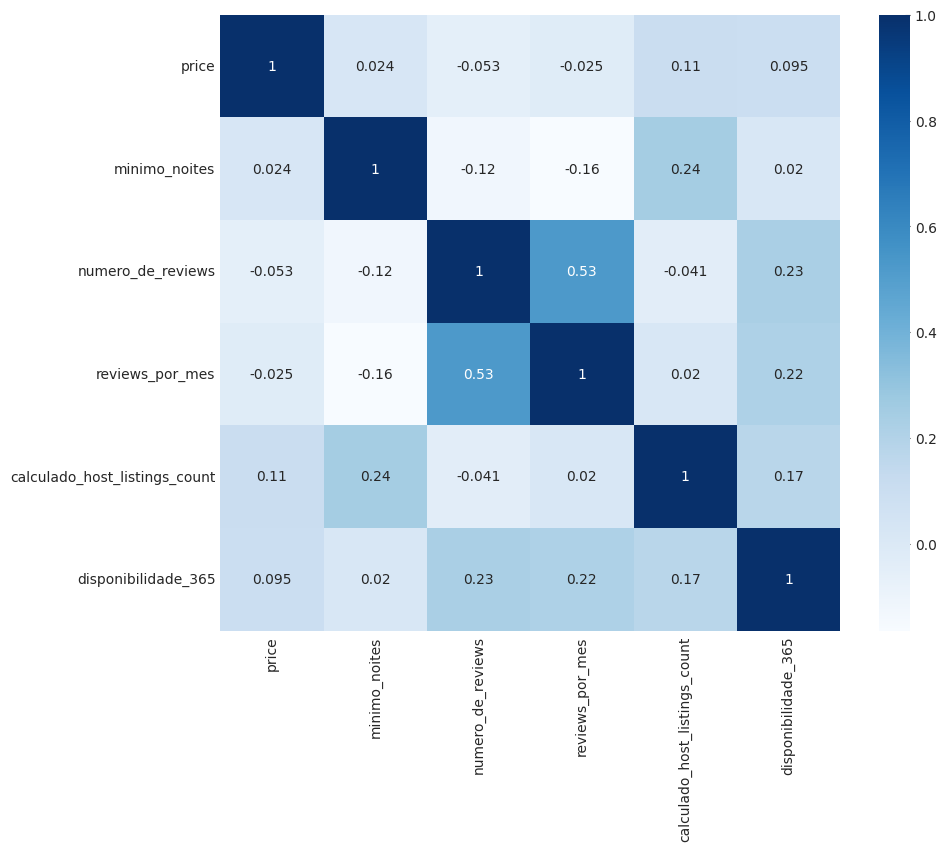

In [56]:
# Melhorar a visualização das correlações através de um heatmap

plt.figure(figsize = (10,8))
sns.heatmap(data=data_num.corr(), annot=True, cmap = 'Blues')
plt.show()

Fazendo uma matriz de correlação com os dados numericos após o tratamento dos outliers, é evidente que as relações estão muito fracas em relação ao `price`. Nas observações feitas no começo do projeto sobre cada tipo de `bairro_group`, `bairro` e `room_type`, ficou claro que havia um desbalanceamento entre cada categoria pelas diferenças entre cada região de Nova Iorque. Como não há bairros coincidentes dentro de cada distrito, é possível criar uma categoria de correlação levando em consideração os distritos e cada tipo de quarto.

## 1ª hipótese/ ideia - filtro individual

In [57]:
bronx = data_new[data_new.bairro_group == 'Bronx']
brooklyn = data_new[data_new.bairro_group == 'Brooklyn']
manhattan = data_new[data_new.bairro_group == 'Manhattan']
queens = data_new[data_new.bairro_group == 'Queens']
staten = data_new[data_new.bairro_group == 'Staten Island']

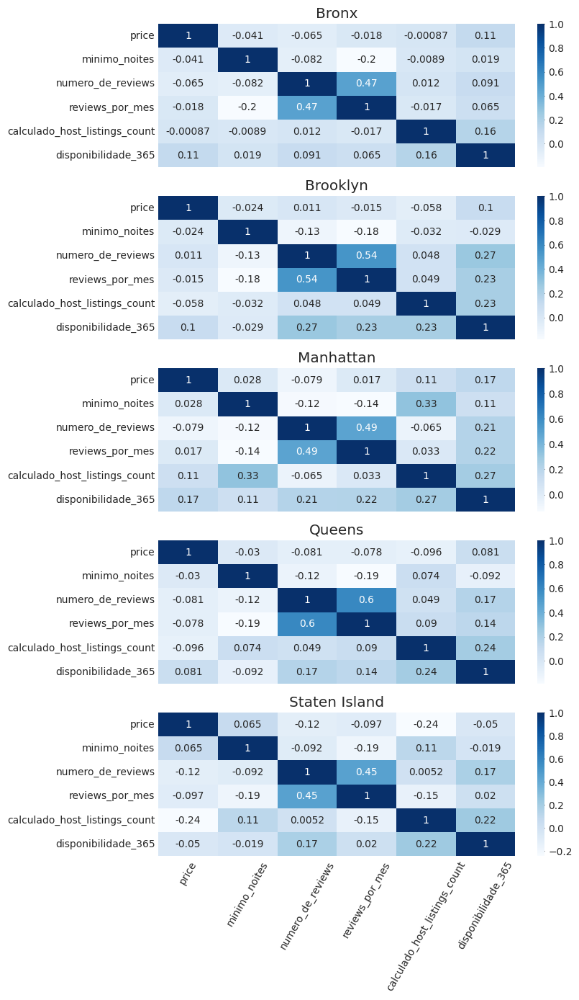

In [58]:
fig, ax = plt.subplots(5,1, figsize=(8, 15))

sns.heatmap(data=bronx[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[0], xticklabels = False)
sns.heatmap(data=brooklyn[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[1], xticklabels = False)
sns.heatmap(data=manhattan[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[2], xticklabels = False)
sns.heatmap(data=queens[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[3], xticklabels = False)
sns.heatmap(data=staten[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[4])

ax[4].tick_params(axis = 'x', rotation=60)

ax[0].set_title('Bronx')
ax[1].set_title('Brooklyn')
ax[2].set_title('Manhattan')
ax[3].set_title('Queens')
ax[4].set_title('Staten Island')

fig.show()

In [59]:
bronx_apt = bronx[bronx.room_type == 'Entire home/apt']
bronx_room = bronx[bronx.room_type == 'Private room']
bronx_shared = bronx[bronx.room_type == 'Shared room']

brooklyn_apt = brooklyn[brooklyn.room_type == 'Entire home/apt']
brooklyn_room = brooklyn[brooklyn.room_type == 'Private room']
brooklyn_shared = brooklyn[brooklyn.room_type == 'Shared room']

manhattan_apt = manhattan[manhattan.room_type == 'Entire home/apt']
manhattan_room = manhattan[manhattan.room_type == 'Private room']
manhattan_shared = manhattan[manhattan.room_type == 'Shared room']

queens_apt = queens[queens.room_type == 'Entire home/apt']
queens_room = queens[queens.room_type == 'Private room']
queens_shared = queens[queens.room_type == 'Shared room']

staten_apt = staten[staten.room_type == 'Entire home/apt']
staten_room = staten[staten.room_type == 'Private room']
staten_shared = staten[staten.room_type == 'Shared room']

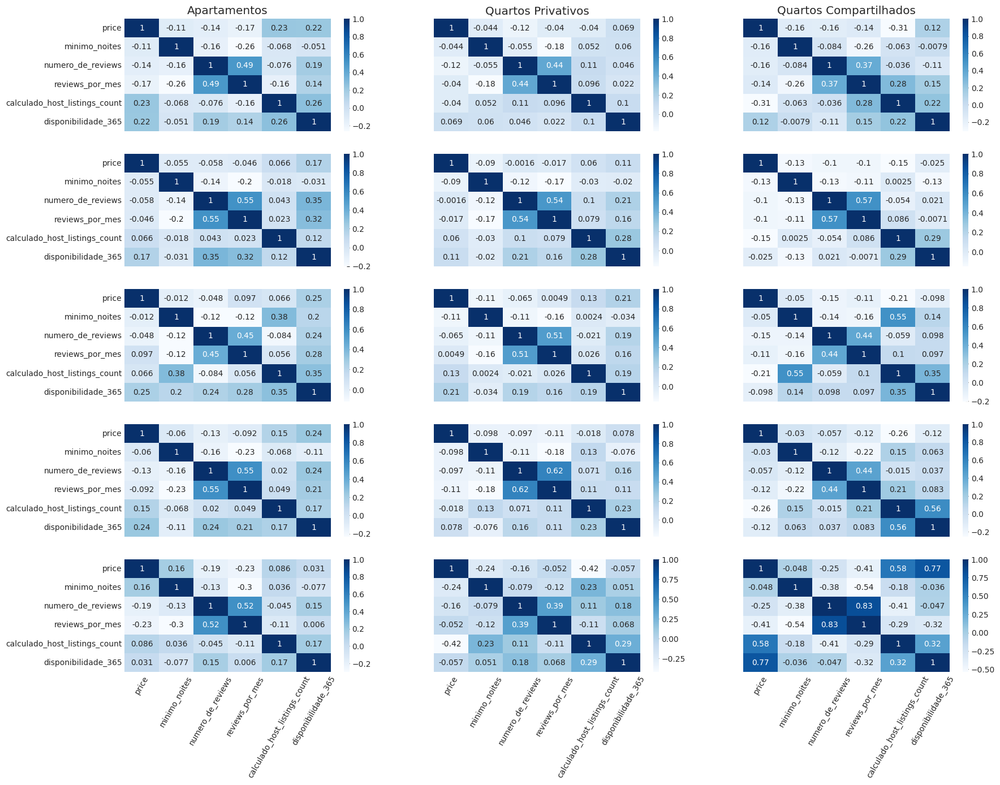

In [60]:
fig, ax = plt.subplots(5,3, figsize=(20, 15))

sns.heatmap(data=bronx_apt[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[0,0], xticklabels = False)
sns.heatmap(data=bronx_room[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[0,1], xticklabels = False, yticklabels = False)
sns.heatmap(data=bronx_shared[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[0,2], xticklabels = False, yticklabels = False)

sns.heatmap(data=brooklyn_apt[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[1,0], xticklabels = False)
sns.heatmap(data=brooklyn_room[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[1,1], xticklabels = False, yticklabels = False)
sns.heatmap(data=brooklyn_shared[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[1,2], xticklabels = False, yticklabels = False)

sns.heatmap(data=manhattan_apt[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[2,0], xticklabels = False)
sns.heatmap(data=manhattan_room[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[2,1], xticklabels = False, yticklabels = False)
sns.heatmap(data=manhattan_shared[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[2,2], xticklabels = False, yticklabels = False)

sns.heatmap(data=queens_apt[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[3,0], xticklabels = False)
sns.heatmap(data=queens_room[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[3,1], xticklabels = False, yticklabels = False)
sns.heatmap(data=queens_shared[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[3,2], xticklabels = False, yticklabels = False)

sns.heatmap(data=staten_apt[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[4,0])
sns.heatmap(data=staten_room[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[4,1], yticklabels = False)
sns.heatmap(data=staten_shared[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[4,2], yticklabels = False)

ax[0,0].set_title('Apartamentos')
ax[0,1].set_title('Quartos Privativos')
ax[0,2].set_title('Quartos Compartilhados')

ax[4,0].tick_params(axis = 'x', rotation=60)
ax[4,1].tick_params(axis = 'x', rotation=60)
ax[4,2].tick_params(axis = 'x', rotation=60)

fig.show()

Aproximando para um olhar mais regional com separação de distritos ou distritos e tipos de quartos juntos ao invés de uma média completa da cidade, é possível perceber o quanto as correlações ficam mais fortes. Um exemplo claro é a relação de disponibilidade, que era de 0,095 nos dados gerais de Nova Iorque, já em quartos compartilhados no distrito de Staten Island, ela sobe para 0,77.

Essa análise também mostra que os dados zerados identificados em `numero_de_reviews` e `disponibilidade_365` não devem passar por nenhum tipo de tratamento, pois apresentam correlações consideráveis que impactam diretamente no pricing. Já a coluna de `minimo_noites` também impacta, mas com uma participação consideravelmente menor.

E se o algoritmo for ainda mais específico? Aprofundando em cada bairro alvo ao invés dos distritos apenas?

### Exemplo Bronx - quartos individuais

In [61]:
# Escolhendo um bairro ao acaso

bronx.groupby('bairro').count().head()

,bairro_group,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
bairro,,,,,,,,
Allerton,42,42,42,42,42,42,42,42
Baychester,7,7,7,7,7,7,7,7
Belmont,23,23,23,23,23,23,23,23
Bronxdale,19,19,19,19,19,19,19,19
Castle Hill,9,9,9,9,9,9,9,9


In [62]:
# Gerando um filtro para esse bairro em um dos tipos de imóvel

allerton = bronx[(bronx.bairro == 'Allerton') & (bronx.room_type == 'Private room')][num_columns].corr()

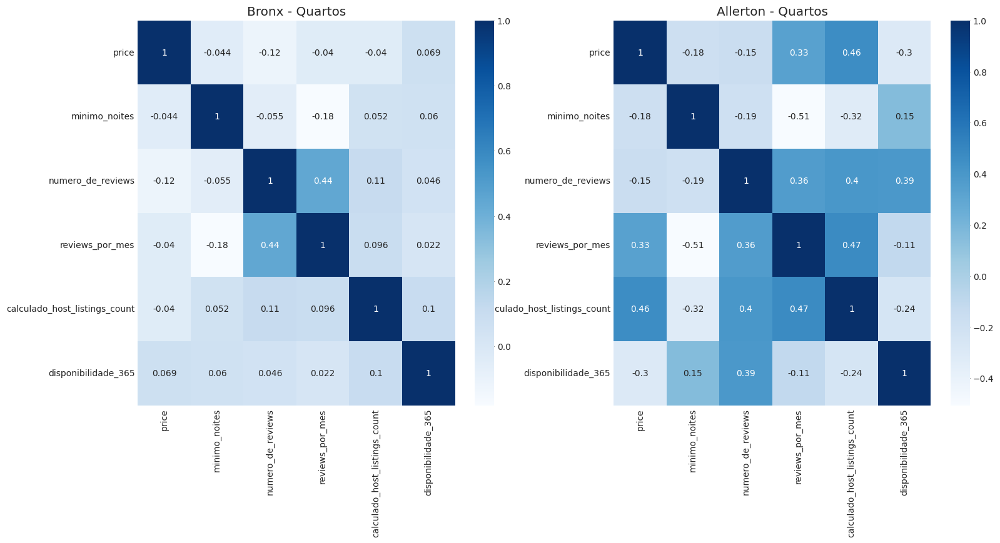

In [63]:
# Plotando uma comparação entre correlações da média do distrito com um bairro especifico, usando o mesmo tipo de imóvel

fig, ax = plt.subplots(1,2, figsize=(18, 8))
sns.heatmap(data=bronx_room[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[0])
sns.heatmap(data=allerton, annot=True, cmap = 'Blues', ax=ax[1])
ax[0].set_title('Bronx - Quartos')
ax[1].set_title('Allerton - Quartos')
plt.show()

### Exemplo Manhattan - apartamentos/casas

In [64]:
# Escolhendo um bairro ao acaso

manhattan.groupby('bairro').count().head()

,bairro_group,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
bairro,,,,,,,,
Battery Park City,52,52,52,52,52,52,52,52
Chelsea,931,931,931,931,931,931,931,931
Chinatown,345,345,345,345,345,345,345,345
Civic Center,46,46,46,46,46,46,46,46
East Harlem,1050,1050,1050,1050,1050,1050,1050,1050


In [65]:
# Gerando um filtro para esse bairro em um dos tipos de imóvel

chinatown = manhattan[(manhattan.bairro == 'Chinatown') & (manhattan.room_type == 'Entire home/apt')][num_columns].corr()

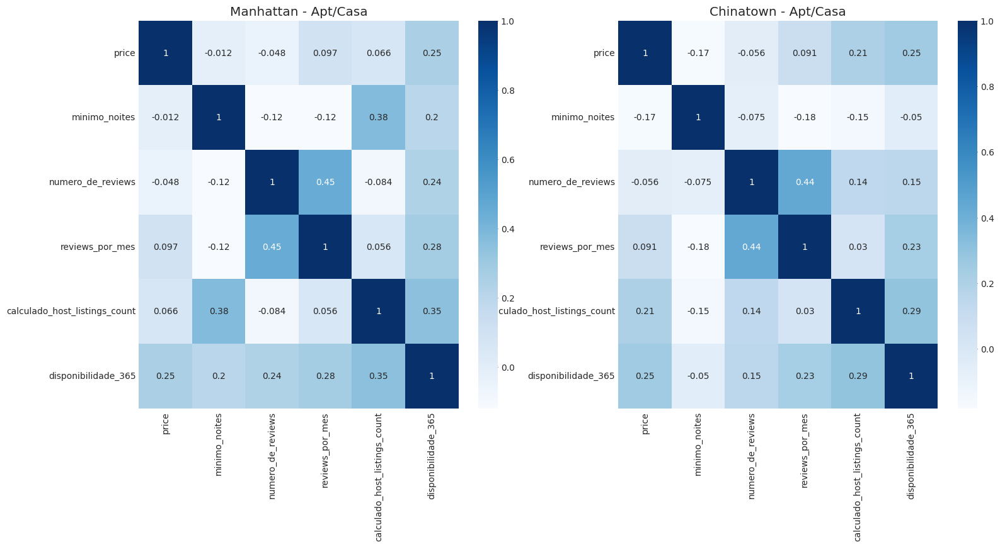

In [66]:
# Plotando uma comparação entre correlações da média do distrito com um bairro especifico, usando o mesmo tipo de imóvel

fig, ax = plt.subplots(1,2, figsize=(18, 8))
sns.heatmap(data=manhattan_apt[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[0])
sns.heatmap(data=chinatown, annot=True, cmap = 'Blues', ax=ax[1])
ax[0].set_title('Manhattan - Apt/Casa')
ax[1].set_title('Chinatown - Apt/Casa')
plt.show()

### Exemplo Queens - quartos compartilhados

In [67]:
# Escolhendo um bairro ao acaso

queens.groupby('bairro').count().head()

,bairro_group,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
bairro,,,,,,,,
Arverne,76,76,76,76,76,76,76,76
Astoria,838,838,838,838,838,838,838,838
Bay Terrace,6,6,6,6,6,6,6,6
Bayside,37,37,37,37,37,37,37,37
Bayswater,15,15,15,15,15,15,15,15


In [68]:
# Gerando um filtro para esse bairro em um dos tipos de imóvel

astoria = queens[(queens.bairro == 'Astoria') & (queens.room_type == 'Shared room')][num_columns].corr()

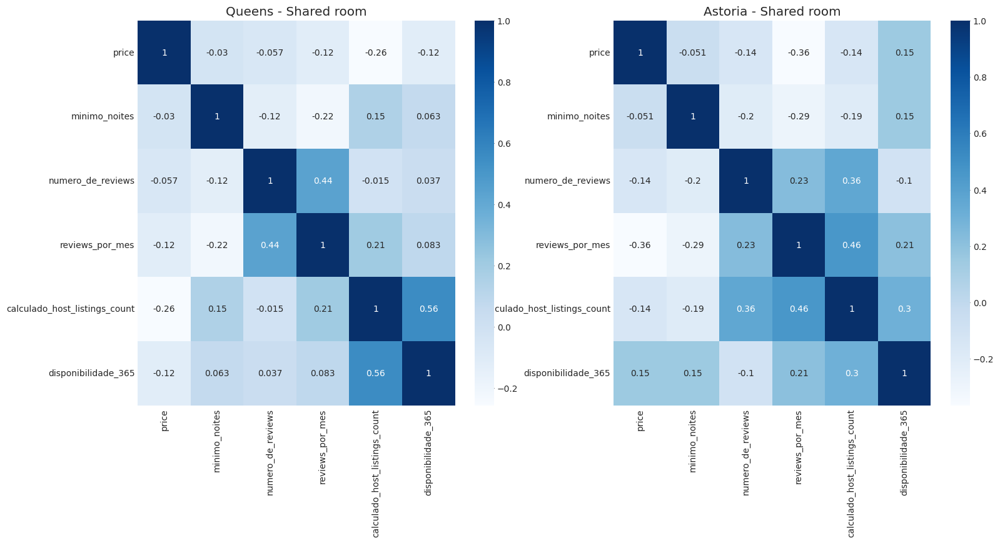

In [69]:
# Plotando uma comparação entre correlações da média do distrito com um bairro especifico, usando o mesmo tipo de imóvel

fig, ax = plt.subplots(1,2, figsize=(18, 8))
sns.heatmap(data=queens_shared[num_columns].corr(), annot=True, cmap = 'Blues', ax=ax[0])
sns.heatmap(data=astoria, annot=True, cmap = 'Blues', ax=ax[1])
ax[0].set_title('Queens - Shared room')
ax[1].set_title('Astoria - Shared room')
plt.show()

Foi possível perceber que existe uma variação de correlações muito grande quando são comparados os distritos com cada bairro. Dessa forma, a primeira ideia do algoritmo será seguida com um grande filtro antes de entrar nos dados de processamento, separando dados de treino e teste para cada um dos 221 bairros do dataset. Caso algum bairro em específico careça de dados suficientes, será utilizado a média do distrito.

## 2º hipótese/ideia - Padronização das variáveis categóricas

Uma segunda ideia seria padronizar as variáveis categóricas de distritos e quartos para uma análise matricial. Neste segundo caso, não é possível a transformação de cada bairro pois isso significariam mais 221 colunas de atributos para os dados.

In [70]:
# Atualizando o tipo dos dados do dataframe de categorias

data_cat = data_cat.astype('category')
data_cat.reset_index(drop=True, inplace=True)
data_cat

,bairro_group,bairro,room_type
0,Manhattan,Harlem,Private room
1,Brooklyn,Clinton Hill,Entire home/apt
2,Manhattan,East Harlem,Entire home/apt
3,Manhattan,Murray Hill,Entire home/apt
4,Manhattan,Hell's Kitchen,Private room
...,...,...,...
43941,Brooklyn,Bedford-Stuyvesant,Private room
43942,Brooklyn,Bushwick,Private room
43943,Manhattan,Harlem,Entire home/apt
43944,Manhattan,Hell's Kitchen,Shared room


In [71]:
# Usar um encoder nominal para os bairros, já que cada um deles vai funcionar como uma coluna separada sem ordenação

encoder = OneHotEncoder(sparse_output=False)
encoded_bairro_group = encoder.fit_transform(data_cat[['bairro_group']])
data_encoded_bairro_group = pd.DataFrame(encoded_bairro_group, columns=encoder.get_feature_names_out(['bairro_group']))

data_encoded_bairro_group

,bairro_group_Bronx,bairro_group_Brooklyn,bairro_group_Manhattan,bairro_group_Queens,bairro_group_Staten Island
0,0.0,0.0,1.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0
4,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...
43941,0.0,1.0,0.0,0.0,0.0
43942,0.0,1.0,0.0,0.0,0.0
43943,0.0,0.0,1.0,0.0,0.0
43944,0.0,0.0,1.0,0.0,0.0


In [72]:
# Criando um novo dataframe que será usado nessa segunda hipótese, contendo todos os dados finais para a modelagem

data_final = data_cat.drop(['bairro_group'], axis=1, inplace=True)
data_final = pd.concat([data_cat, data_encoded_bairro_group], axis=1)
data_final

,bairro,room_type,bairro_group_Bronx,bairro_group_Brooklyn,bairro_group_Manhattan,bairro_group_Queens,bairro_group_Staten Island
0,Harlem,Private room,0.0,0.0,1.0,0.0,0.0
1,Clinton Hill,Entire home/apt,0.0,1.0,0.0,0.0,0.0
2,East Harlem,Entire home/apt,0.0,0.0,1.0,0.0,0.0
3,Murray Hill,Entire home/apt,0.0,0.0,1.0,0.0,0.0
4,Hell's Kitchen,Private room,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...
43941,Bedford-Stuyvesant,Private room,0.0,1.0,0.0,0.0,0.0
43942,Bushwick,Private room,0.0,1.0,0.0,0.0,0.0
43943,Harlem,Entire home/apt,0.0,0.0,1.0,0.0,0.0
43944,Hell's Kitchen,Shared room,0.0,0.0,1.0,0.0,0.0


In [73]:
# Usar um encoder ordinal para os imóveis, já que havia ficado claro haver uma relação direta dos preços, sendo os apt/casa os mais caros e os quartos compartilhado os mais baratos

encoder = OrdinalEncoder()
data_final['room_type'] = data_final['room_type'].cat.reorder_categories(['Shared room', 'Private room', 'Entire home/apt'], ordered=True)
encoded_room_type = encoder.fit_transform(data_final[['room_type']])
data_encoded_room_type = pd.DataFrame(encoded_room_type, columns=encoder.get_feature_names_out(['room_type']))

data_encoded_room_type

,room_type
0,1.0
1,0.0
2,0.0
3,0.0
4,1.0
...,...
43941,1.0
43942,1.0
43943,0.0
43944,2.0


In [74]:
# retirando a coluna categórica de tipo de quarto e substituindo pela padronizada

data_final.drop(['room_type'], axis=1, inplace=True)
data_final = pd.concat([data_final, data_encoded_room_type], axis=1)
data_final

,bairro,bairro_group_Bronx,bairro_group_Brooklyn,bairro_group_Manhattan,bairro_group_Queens,bairro_group_Staten Island,room_type
0,Harlem,0.0,0.0,1.0,0.0,0.0,1.0
1,Clinton Hill,0.0,1.0,0.0,0.0,0.0,0.0
2,East Harlem,0.0,0.0,1.0,0.0,0.0,0.0
3,Murray Hill,0.0,0.0,1.0,0.0,0.0,0.0
4,Hell's Kitchen,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...
43941,Bedford-Stuyvesant,0.0,1.0,0.0,0.0,0.0,1.0
43942,Bushwick,0.0,1.0,0.0,0.0,0.0,1.0
43943,Harlem,0.0,0.0,1.0,0.0,0.0,0.0
43944,Hell's Kitchen,0.0,0.0,1.0,0.0,0.0,2.0


In [75]:
# retirando a coluna de bairros, pois eles representariam mais 221 colunas no dataset
data_final.drop(['bairro'], axis=1, inplace = True)

In [76]:
# atualizando o dataframe final com os outros dados numéricos
data_final.reset_index(drop=True, inplace=True)
data_final = pd.concat([data_num, data_final], axis=1)
data_final

,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,bairro_group_Bronx,bairro_group_Brooklyn,bairro_group_Manhattan,bairro_group_Queens,bairro_group_Staten Island,room_type
0,150,3,0,1.439128,1,365,0.0,0.0,1.0,0.0,0.0,1.0
1,89,1,270,4.640000,1,194,0.0,1.0,0.0,0.0,0.0,0.0
2,80,10,9,0.100000,1,0,0.0,0.0,1.0,0.0,0.0,0.0
3,200,3,74,0.590000,1,129,0.0,0.0,1.0,0.0,0.0,0.0
4,79,2,430,3.470000,1,220,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
43941,70,2,0,1.439128,2,9,0.0,1.0,0.0,0.0,0.0,1.0
43942,40,4,0,1.439128,2,36,0.0,1.0,0.0,0.0,0.0,1.0
43943,115,10,0,1.439128,1,27,0.0,0.0,1.0,0.0,0.0,0.0
43944,55,1,0,1.439128,6,2,0.0,0.0,1.0,0.0,0.0,2.0


In [77]:
# nova correlação
data_final.corr()

,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,bairro_group_Bronx,bairro_group_Brooklyn,bairro_group_Manhattan,bairro_group_Queens,bairro_group_Staten Island,room_type
price,1.000000,0.023928,-0.052712,-0.024734,0.108432,0.095017,-0.078468,-0.161819,0.287751,-0.144046,-0.036082,-0.500658
minimo_noites,0.023928,1.000000,-0.122136,-0.164456,0.244941,0.019611,-0.033688,-0.000085,0.051223,-0.055865,-0.021688,-0.096185
numero_de_reviews,-0.052712,-0.122136,1.000000,0.525599,-0.041177,0.230211,0.006253,0.002922,-0.029739,0.033797,0.014468,-0.009146
reviews_por_mes,-0.024734,-0.164456,0.525599,1.000000,0.020419,0.215342,0.035894,-0.055087,-0.034141,0.112248,0.023515,0.023289
calculado_host_listings_count,0.108432,0.244941,-0.041177,0.020419,1.000000,0.173728,-0.013401,-0.082611,0.108170,-0.030363,-0.007113,-0.067032
disponibilidade_365,0.095017,0.019611,0.230211,0.215342,0.173728,1.000000,0.078660,-0.051341,-0.063264,0.118206,0.069210,0.067246
bairro_group_Bronx,-0.078468,-0.033688,0.006253,0.035894,-0.013401,0.078660,1.000000,-0.134792,-0.133474,-0.057861,-0.014012,0.054084
bairro_group_Brooklyn,-0.161819,-0.000085,0.002922,-0.055087,-0.082611,-0.051341,-0.134792,1.000000,-0.735721,-0.318936,-0.077233,0.032694
bairro_group_Manhattan,0.287751,0.051223,-0.029739,-0.034141,0.108170,-0.063264,-0.133474,-0.735721,1.000000,-0.315816,-0.076477,-0.110340
bairro_group_Queens,-0.144046,-0.055865,0.033797,0.112248,-0.030363,0.118206,-0.057861,-0.318936,-0.315816,1.000000,-0.033153,0.090692


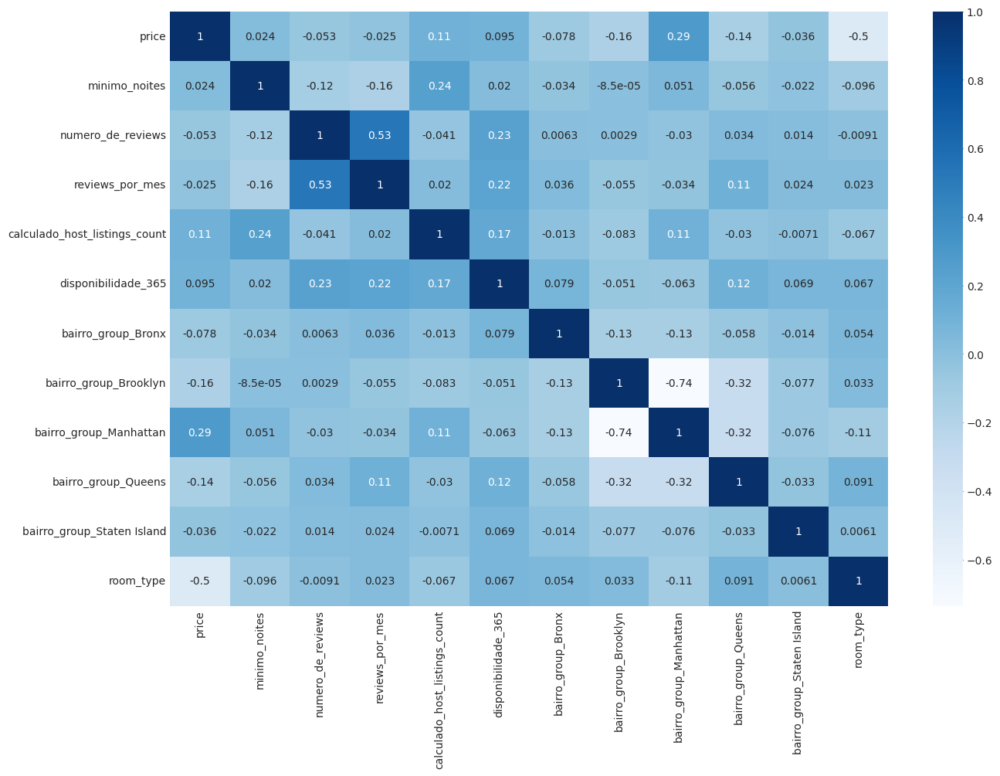

In [78]:
# Heatmap com a nova correlação

plt.figure(figsize = (15,10))
sns.heatmap(data=data_final.corr(), annot=True, cmap = 'Blues')
plt.show()

CONCLUSÕES SOBRE OS PADRÕES, DEFINIÇÃO DO MODELO QUE SERÁ SEGUIDO

# MODELAGEM

## 1ª ideia: modelos separados

### Dados originais

In [136]:
# criando um novo dataframe para trabalhar nessa modelagem e um dicionário para armazenar todos os valores para os modelos

data_separated = data_new.copy()
datasets_sep_bairros = {}
data_separated

,bairro_group,bairro,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,Manhattan,Harlem,Private room,150,3,0,1.439128,1,365
1,Brooklyn,Clinton Hill,Entire home/apt,89,1,270,4.640000,1,194
2,Manhattan,East Harlem,Entire home/apt,80,10,9,0.100000,1,0
3,Manhattan,Murray Hill,Entire home/apt,200,3,74,0.590000,1,129
4,Manhattan,Hell's Kitchen,Private room,79,2,430,3.470000,1,220
...,...,...,...,...,...,...,...,...,...
43941,Brooklyn,Bedford-Stuyvesant,Private room,70,2,0,1.439128,2,9
43942,Brooklyn,Bushwick,Private room,40,4,0,1.439128,2,36
43943,Manhattan,Harlem,Entire home/apt,115,10,0,1.439128,1,27
43944,Manhattan,Hell's Kitchen,Shared room,55,1,0,1.439128,6,2


In [137]:
# Separar os dados para cada distrito, bairro e tipo de quarto
for (bairro_group, bairro, room_type), grouped in data_separated.groupby(['bairro_group', 'bairro', 'room_type']):

    if len(grouped) > 1: #filtro para criar o modelo com todos os dados originais, sem alterações

        X = grouped.drop(columns=['price', 'bairro_group', 'bairro', 'room_type'])
        y = grouped['price']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=15)

    # Armazenando no dicionário
    datasets_sep_bairros[(bairro, room_type)] = {
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test
    }

In [138]:
# Dicionário com todos os itens de treino e teste separados por bairro e tipo de quarto
datasets_sep_bairros

{('Allerton',
  'Entire home/apt'): {'X_train':        minimo_noites  numero_de_reviews  reviews_por_mes  \
  33886              5                  1         0.160000   
  1479               2                189         2.320000   
  43074              2                  1         1.000000   
  25200              2                  7         0.360000   
  38682              1                 28         8.320000   
  34060              3                 26         3.360000   
  459                2                271         2.840000   
  27198              2                 22         1.440000   
  38994              2                  0         1.439128   
  34604              1                  7         0.930000   
  23683              2                 95         4.460000   
  30135              2                 31         2.500000   
  
         calculado_host_listings_count  disponibilidade_365  
  33886                              1                  157  
  1479               

In [139]:
# Dicionário com os modelos empregados. Também será usado o CatBoost, mas nesse primeiro dicionário existiam bairros com amostras muito pequenas

models = {
    "LinearRegression": LinearRegression,
    "RandomForest": RandomForestRegressor,
         }

results = []

# Loop para uso dos modelos e nomeá-los no resultado final
for name, model_class in models.items():
    print(f"Training {name}...")

    # Loop para buscar no dicionário os dados realizados anteriormente
    for (bairro, room_type), data in datasets_sep_bairros.items():

        if name == "LinearRegression":
            model = model_class()
        elif name == "RandomForest":
            model = model_class(n_estimators=100, random_state=15)

        X_train, X_test = data['X_train'], data['X_test']
        y_train, y_test = data['y_train'], data['y_test']

        model.fit(X_train, y_train)

        y_pred = model.predict(X_test)

        # Calculando métricas
        mae = mean_absolute_error(y_test, y_pred)
        rmse = root_mean_squared_error(y_test, y_pred)

        # Armazenando o modelo e as métricas
        results.append({
            "Modelo": name,
            "Bairro": bairro,
            "Tipo de imóvel": room_type,
            "MAE": mae,
            "RMSE": rmse
        })

data_results = pd.DataFrame(results)
data_results.set_index(['Bairro', 'Tipo de imóvel'], inplace=True)
data_results

Training LinearRegression...
Training RandomForest...


Modelo        MAE        RMSE
Bairro        Tipo de imóvel                                          
Allerton      Entire home/apt  LinearRegression  80.296690  137.169154
              Private room     LinearRegression  37.516826   42.546095
Baychester    Entire home/apt  LinearRegression  36.069276   36.069276
              Private room     LinearRegression   6.994510    6.994510
Belmont       Entire home/apt  LinearRegression  41.519672   41.519672
...                                         ...        ...         ...
West Brighton Private room         RandomForest  15.753333   16.053276
Westerleigh   Entire home/apt      RandomForest  15.753333   16.053276
              Private room         RandomForest  15.753333   16.053276
Willowbrook   Entire home/apt      RandomForest  15.753333   16.053276
Woodrow       Entire home/apt      RandomForest  15.753333   16.053276

[1072 rows x 3 columns]

In [140]:
# A média dos dados não foi tão ruim quanto o esperado
data_results.groupby('Modelo').mean()

,MAE,RMSE
Modelo,,
LinearRegression,89.471583,103.007668
RandomForest,45.963605,55.797327


In [141]:
# Mas a ausência de dados para alguns bairros e tipos de quarto certamente influenciou negativamente no modelo
data_results.sort_values(by='MAE', ascending = True)

Modelo          MAE         RMSE
Bairro          Tipo de imóvel                                             
Howland Hook    Entire home/apt      RandomForest     0.000000     0.000000
                Entire home/apt  LinearRegression     0.000000     0.000000
Van Nest        Shared room      LinearRegression     0.000000     0.000000
                Shared room          RandomForest     0.000000     0.000000
Ozone Park      Shared room      LinearRegression     0.012213     0.012213
...                                           ...          ...          ...
Riverdale       Entire home/apt  LinearRegression  1276.228008  1276.228008
NoHo            Private room     LinearRegression  1513.076433  1810.145151
Mount Hope      Entire home/apt  LinearRegression  1685.799300  1793.898513
Morris Park     Entire home/apt  LinearRegression  1953.690304  1953.690304
Jamaica Estates Private room     LinearRegression  2331.371236  2331.371236

[1072 rows x 3 columns]

### Exclusão de alguns bairros

O dataset original conta com 536 linhas e 43946 dados, mas alguns bairros com poucos dados, como mostra abaixo. Serão separados apenas os dados com pelo menos 10 amostras para um treinamento mais eficiente.

In [142]:
# Amostra original
data_separated.groupby(['bairro_group', 'bairro', 'room_type']).count()

price  minimo_noites  \
bairro_group  bairro        room_type                               
Bronx         Allerton      Entire home/apt     16             16   
                            Private room        26             26   
              Baychester    Entire home/apt      3              3   
                            Private room         4              4   
              Belmont       Entire home/apt      3              3   
...                                            ...            ...   
Staten Island West Brighton Private room        11             11   
              Westerleigh   Entire home/apt      1              1   
                            Private room         1              1   
              Willowbrook   Entire home/apt      1              1   
              Woodrow       Entire home/apt      1              1   

                                             numero_de_reviews  \
bairro_group  bairro        room_type                            
Bronx         Allerton      Entire home/apt                 16   
                            Private room                    26   
              Baychester    Entire home/apt                  3   
                            Private room                     4   
              Belmont       Entire home/apt                  3   
...                                                        ...   
Staten Island West Brighton Private room                    11   
              Westerleigh   Entire home/apt                  1   
                            Private room                     1   
              Willowbrook   Entire home/apt                  1   
              Woodrow       Entire home/apt                  1   

                                             reviews_por_mes  \
bairro_group  bairro        room_type                          
Bronx         Allerton      Entire home/apt               16   
                            Private room                  26   
              Baychester    Entire home/apt                3   
                            Private room                   4   
              Belmont       Entire home/apt                3   
...                                                      ...   
Staten Island West Brighton Private room                  11   
              Westerleigh   Entire home/apt                1   
                            Private room                   1   
              Willowbrook   Entire home/apt                1   
              Woodrow       Entire home/apt                1   

                                             calculado_host_listings_count  \
bairro_group  bairro        room_type                                        
Bronx         Allerton      Entire home/apt                             16   
                            Private room                                26   
              Baychester    Entire home/apt                              3   
                            Private room                                 4   
              Belmont       Entire home/apt                              3   
...                                                                    ...   
Staten Island West Brighton Private room                                11   
              Westerleigh   Entire home/apt                              1   
                            Private room                                 1   
              Willowbrook   Entire home/apt                              1   
              Woodrow       Entire home/apt                              1   

                                             disponibilidade_365  
bairro_group  bairro        room_type                             
Bronx         Allerton      Entire home/apt                   16  
                            Private room                      26  
              Baychester    Entire home/apt                    3  
                            Private room                       4  
              Belmont       Entire hom

In [143]:
# Amostra original
data_separated.groupby(['bairro_group', 'bairro', 'room_type']).count().sum()

,0
price,43946
minimo_noites,43946
numero_de_reviews,43946
reviews_por_mes,43946
calculado_host_listings_count,43946
disponibilidade_365,43946


In [144]:
# criando um novo dataframe e dicionário, que agora conta com 284 linhas e 42997 dados

datasets_sep_bairros_new = {}

# filtro para retirar dados baixo de 9 amostras de agrupamento
filter_index = data_separated.groupby(['bairro_group', 'bairro', 'room_type']).count().where(lambda x: x['price'] > 9).dropna()

# Juntando tudo no novo dataframe e ajustando os nomes
data_separated_new = data_separated.merge(filter_index, on=['bairro_group', 'bairro', 'room_type'])
data_separated_new.drop(columns=['price_y',	'minimo_noites_y',	'numero_de_reviews_y',	'reviews_por_mes_y',	'calculado_host_listings_count_y',	'disponibilidade_365_y'], inplace=True)
rename_list = ['price', 'minimo_noites', 'numero_de_reviews', 'reviews_por_mes', 'calculado_host_listings_count', 'disponibilidade_365']
data_separated_new.rename(columns=dict(zip(data_separated_new.columns[3:], rename_list)), inplace=True)

data_separated_new

,bairro_group,bairro,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,Manhattan,Harlem,Private room,150,3,0,1.439128,1,365
1,Brooklyn,Clinton Hill,Entire home/apt,89,1,270,4.640000,1,194
2,Manhattan,East Harlem,Entire home/apt,80,10,9,0.100000,1,0
3,Manhattan,Murray Hill,Entire home/apt,200,3,74,0.590000,1,129
4,Manhattan,Hell's Kitchen,Private room,79,2,430,3.470000,1,220
...,...,...,...,...,...,...,...,...,...
42992,Brooklyn,Bedford-Stuyvesant,Private room,70,2,0,1.439128,2,9
42993,Brooklyn,Bushwick,Private room,40,4,0,1.439128,2,36
42994,Manhattan,Harlem,Entire home/apt,115,10,0,1.439128,1,27
42995,Manhattan,Hell's Kitchen,Shared room,55,1,0,1.439128,6,2


In [145]:
# Separar os dados para cada distrito, bairro e tipo de quarto
for (bairro_group, bairro, room_type), grouped in data_separated_new.groupby(['bairro_group', 'bairro', 'room_type']):

    X2 = grouped.drop(columns=['price', 'bairro_group', 'bairro', 'room_type'])
    y2 = grouped['price']

    X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=15)

    # Armazenando no dicionário
    datasets_sep_bairros_new[(bairro, room_type)] = {
        'X2_train': X2_train,
        'X2_test': X2_test,
        'y2_train': y2_train,
        'y2_test': y2_test
    }

In [146]:
datasets_sep_bairros_new

{('Allerton',
  'Entire home/apt'): {'X2_train':        minimo_noites  numero_de_reviews  reviews_por_mes  \
  33244              5                  1         0.160000   
  1463               2                189         2.320000   
  42166              2                  1         1.000000   
  24789              2                  7         0.360000   
  37906              1                 28         8.320000   
  33413              3                 26         3.360000   
  456                2                271         2.840000   
  26751              2                 22         1.440000   
  38209              2                  0         1.439128   
  33945              1                  7         0.930000   
  23299              2                 95         4.460000   
  29621              2                 31         2.500000   
  
         calculado_host_listings_count  disponibilidade_365  
  33244                              1                  157  
  1463              

In [147]:
# Dicionário com os modelos empregados, agora com a possibilidade de usar o CatBoost

models = {
    "LinearRegression": LinearRegression,
    "RandomForest": RandomForestRegressor,
         }

results2 = []

# Loop para uso dos modelos e nomeá-los no resultado final
for name, model_class in models.items():
    print(f"Training {name}...")

    # Loop para buscar no dicionário os dados realizados anteriormente
    for (bairro, room_type), data in datasets_sep_bairros_new.items():

        if name == "LinearRegression":
            model = model_class()
        elif name == "RandomForest":
            model = model_class(n_estimators=100, random_state=15)

        X2_train, X2_test = data['X2_train'], data['X2_test']
        y2_train, y2_test = data['y2_train'], data['y2_test']

        model.fit(X2_train, y2_train)

        y2_pred = model.predict(X2_test)

        # Calculando métricas
        mae = mean_absolute_error(y2_test, y2_pred)
        rmse = root_mean_squared_error(y2_test, y2_pred)

        # Armazenando o modelo e as métricas
        results2.append({
            "Modelo": name,
            "Bairro": bairro,
            "Tipo de imóvel": room_type,
            "MAE": mae,
            "RMSE": rmse
        })

data_results2 = pd.DataFrame(results2)
data_results2.set_index(['Bairro', 'Tipo de imóvel'], inplace=True)
data_results2

Training LinearRegression...
Training RandomForest...


Modelo        MAE        RMSE
Bairro        Tipo de imóvel                                          
Allerton      Entire home/apt  LinearRegression  80.296690  137.169154
              Private room     LinearRegression  37.516826   42.546095
Belmont       Private room     LinearRegression  38.863625   39.275625
Bronxdale     Private room     LinearRegression   6.721827    7.038770
City Island   Entire home/apt  LinearRegression  42.540714   52.093769
...                                         ...        ...         ...
St. George    Private room         RandomForest  22.881071   25.143400
Stapleton     Private room         RandomForest  16.475000   17.656277
Tompkinsville Entire home/apt      RandomForest  31.316667   40.517539
              Private room         RandomForest  12.841667   19.241283
West Brighton Private room         RandomForest  15.753333   16.053276

[568 rows x 3 columns]

In [148]:
data_results2.groupby('Modelo').mean()

,MAE,RMSE
Modelo,,
LinearRegression,51.271900,68.137515
RandomForest,43.973315,60.373102


Os modelos ainda podem melhorar. A próxima aplicação será retirando todos os outliers além do Z-score, seguindo a mesma linha de pensamento.

### Exclusão dos ouliers além do Z-score

In [149]:
# criando um novo dataframe e dicionário. Os dados reduziram de 42997 para 40804 dados.

data_separated_final = data_separated_new.copy()
datasets_sep_bairros_final = {}

def calcula_limites_outliers(col):
    q1 = col.quantile(0.25)
    q3 = col.quantile(0.75)
    iqr = q3 - q1

    limite_inferior = q1 - 1.5 * iqr
    limite_superior = q3 + 1.5 * iqr

    return limite_inferior, limite_superior

limites = calcula_limites_outliers(data_separated_final["price"])
outliers = (data_separated_final["price"] < limites[0]) | (data_separated_final["price"] > limites[1])
data_separated_final = data_separated_final[~outliers]
data_separated_final

,bairro_group,bairro,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,Manhattan,Harlem,Private room,150,3,0,1.439128,1,365
1,Brooklyn,Clinton Hill,Entire home/apt,89,1,270,4.640000,1,194
2,Manhattan,East Harlem,Entire home/apt,80,10,9,0.100000,1,0
3,Manhattan,Murray Hill,Entire home/apt,200,3,74,0.590000,1,129
4,Manhattan,Hell's Kitchen,Private room,79,2,430,3.470000,1,220
...,...,...,...,...,...,...,...,...,...
42992,Brooklyn,Bedford-Stuyvesant,Private room,70,2,0,1.439128,2,9
42993,Brooklyn,Bushwick,Private room,40,4,0,1.439128,2,36
42994,Manhattan,Harlem,Entire home/apt,115,10,0,1.439128,1,27
42995,Manhattan,Hell's Kitchen,Shared room,55,1,0,1.439128,6,2


In [150]:
# Resetando index para organizar os dados
data_separated_final.reset_index(drop=True, inplace=True)

In [151]:
# Separar os dados para cada distrito, bairro e tipo de quarto
for (bairro_group, bairro, room_type), grouped in data_separated_final.groupby(['bairro_group', 'bairro', 'room_type']):

    X3 = grouped.drop(columns=['price', 'bairro_group', 'bairro', 'room_type'])
    y3 = grouped['price']

    X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.2, random_state=15)

    # Armazenando no dicionário
    datasets_sep_bairros_final[(bairro, room_type)] = {
        'X3_train': X3_train,
        'X3_test': X3_test,
        'y3_train': y3_train,
        'y3_test': y3_test
    }

In [152]:
datasets_sep_bairros_final

{('Allerton',
  'Entire home/apt'): {'X3_train':        minimo_noites  numero_de_reviews  reviews_por_mes  \
  22330              2                 95         4.460000   
  1380               2                189         2.320000   
  25633              2                 22         1.440000   
  32487              1                  7         0.930000   
  18860              2                 73         2.670000   
  31988              3                 26         3.360000   
  431                2                271         2.840000   
  28361              2                 31         2.500000   
  36483              2                  0         1.439128   
  36195              1                 28         8.320000   
  23763              2                  7         0.360000   
  29364              4                 35         3.130000   
  
         calculado_host_listings_count  disponibilidade_365  
  22330                              1                  225  
  1380              

In [164]:
# Dicionário com os modelos empregados, agora com a possibilidade de usar o CatBoost

models = {
    "LinearRegression": LinearRegression,
    "RandomForest": RandomForestRegressor,
         }

results3 = []

# variáveis para usar em outro script depois
best_mae = float("inf")
best_model_name = None
best_model = None

# Loop para uso dos modelos e nomeá-los no resultado final
for name, model_class in models.items():
    print(f"Training {name}...")

    # Loop para buscar no dicionário os dados realizados anteriormente
    for (bairro, room_type), data in datasets_sep_bairros_final.items():

        if name == "LinearRegression":
            model = model_class()
        elif name == "RandomForest":
            model = model_class(n_estimators=100, random_state=25)

        X3_train, X3_test = data['X3_train'], data['X3_test']
        y3_train, y3_test = data['y3_train'], data['y3_test']

        model.fit(X3_train, y3_train)

        y3_pred = model.predict(X3_test)

        # Calculando métricas
        mae = mean_absolute_error(y3_test, y3_pred)
        rmse = root_mean_squared_error(y3_test, y3_pred)

        # Armazenando o modelo e as métricas
        results3.append({
            "Modelo": name,
            "Bairro": bairro,
            "Tipo de imóvel": room_type,
            "MAE": mae,
            "RMSE": rmse
        })

        # variáveis para usar em outro script depois
        if mae < best_mae:
            best_mae = mae
            best_model_name = name
            best_model = model

data_results3 = pd.DataFrame(results3)
data_results3.set_index(['Bairro', 'Tipo de imóvel'], inplace=True)
data_results3

Training LinearRegression...
Training RandomForest...


Modelo         MAE        RMSE
Bairro        Tipo de imóvel                                           
Allerton      Entire home/apt  LinearRegression   32.133436   33.299512
              Private room     LinearRegression   37.516826   42.546095
Belmont       Private room     LinearRegression   38.863625   39.275625
Bronxdale     Private room     LinearRegression    6.721827    7.038770
City Island   Entire home/apt  LinearRegression  133.144323  185.478572
...                                         ...         ...         ...
St. George    Private room         RandomForest   24.319583   27.804051
Stapleton     Private room         RandomForest   16.832500   17.725254
Tompkinsville Entire home/apt      RandomForest   33.313333   43.105831
              Private room         RandomForest   13.508333   19.834507
West Brighton Private room         RandomForest   16.823333   17.094813

[568 rows x 3 columns]

In [154]:
data_results3.groupby('Modelo').mean()

,MAE,RMSE
Modelo,,
LinearRegression,40.233284,50.641904
RandomForest,32.336393,41.831910


## 2ª ideia: modelos baseados nos dados categóricos transformados

### Dados originais da matriz

Vamos utilizar para esse quarto modelo o data_final que foi criado na identificação dos padrões. A partir dele, vamos decidir qual modelo será o melhor para o algoritmo.

In [155]:
# Por já ter todos os dados organizados, será necessário criar apenas o dicionário

results4 = {}

X4 = data_final.drop(columns=['price'])
y4 = data_final['price']
X4_train, X4_test, y4_train, y4_test = train_test_split(X4, y4, test_size=0.2, random_state=15)

# Dicionário com os modelos empregados

models = {
    "LinearRegression": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=100, random_state=15),
}

# Loop para uso dos modelos e nomeá-los no resultado final
for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X4_train, y4_train)

    y4_pred = model.predict(X4_test)

    # Calculando métricas
    mae = mean_absolute_error(y4_test, y4_pred)
    rmse = root_mean_squared_error(y4_test, y4_pred)

    # Armazenando o modelo e as métricas
    results4[name] = {"MAE": mae, "RMSE": rmse}

# Exibir os resultados

data_results4 = pd.DataFrame(results4).T
data_results4

Training LinearRegression...
Training RandomForest...


,MAE,RMSE
LinearRegression,53.336496,84.233538
RandomForest,51.080989,81.765406


Os dados ainda não chegaram em valores ideais. Será aplicada uma quinta série de treinamentos usando essa mesma linha de pensamento, mas removendo todos os outliers que não haviam sido contemplados na primeira aplicação do Z-score.

### Dados excluindo os outliers além do Z-score

In [156]:
# função para calcular os quartis e depois remover os outliers

def calcula_limites_outliers(col):
    q1 = col.quantile(0.25)
    q3 = col.quantile(0.75)
    iqr = q3 - q1

    limite_inferior = q1 - 1.5 * iqr
    limite_superior = q3 + 1.5 * iqr

    return limite_inferior, limite_superior

limites = calcula_limites_outliers(data_final["price"])
outliers = (data_final["price"] < limites[0]) | (data_final["price"] > limites[1])
data_final_new = data_final[~outliers]

In [157]:
# Os dados reduziram de 43946 para 41685.
data_final_new

,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,bairro_group_Bronx,bairro_group_Brooklyn,bairro_group_Manhattan,bairro_group_Queens,bairro_group_Staten Island,room_type
0,150,3,0,1.439128,1,365,0.0,0.0,1.0,0.0,0.0,1.0
1,89,1,270,4.640000,1,194,0.0,1.0,0.0,0.0,0.0,0.0
2,80,10,9,0.100000,1,0,0.0,0.0,1.0,0.0,0.0,0.0
3,200,3,74,0.590000,1,129,0.0,0.0,1.0,0.0,0.0,0.0
4,79,2,430,3.470000,1,220,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
43941,70,2,0,1.439128,2,9,0.0,1.0,0.0,0.0,0.0,1.0
43942,40,4,0,1.439128,2,36,0.0,1.0,0.0,0.0,0.0,1.0
43943,115,10,0,1.439128,1,27,0.0,0.0,1.0,0.0,0.0,0.0
43944,55,1,0,1.439128,6,2,0.0,0.0,1.0,0.0,0.0,2.0


In [158]:
# Por já ter todos os dados organizados, será necessário criar apenas o dicionário

results5 = {}

# variáveis para usar em outro script depois
best_mae2 = float("inf")
best_model_name2 = None
best_model2 = None

X5 = data_final_new.drop(columns=['price'])
y5 = data_final_new['price']
X5_train, X5_test, y5_train, y5_test = train_test_split(X5, y5, test_size=0.2, random_state=15)

# Dicionário com os modelos empregados

models = {
    "LinearRegression": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=100, random_state=15),
}

# Loop para uso dos modelos e nomeá-los no resultado final
for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X5_train, y5_train)

    y5_pred = model.predict(X5_test)

    # Calculando métricas
    mae = mean_absolute_error(y5_test, y5_pred)
    rmse = root_mean_squared_error(y5_test, y5_pred)

    # Armazenando o modelo e as métricas
    results5[name] = {"MAE": mae, "RMSE": rmse}

    # variáveis para usar em outro script depois
    if mae < best_mae2:
        best_mae2 = mae
        best_model_name2 = name
        best_model2 = model

# Exibir os resultados

data_results5 = pd.DataFrame(results5).T
data_results5

Training LinearRegression...
Training RandomForest...


,MAE,RMSE
LinearRegression,37.180422,49.403502
RandomForest,36.824928,50.147855


Os dois treinamentos que apresentaram os melhores resultados estão representados abaixo. Ambos tiveram a melhor performance com base no modelo RandomForest.

O melhor deles, porém, tem a contrapartida de não contemplar mais todos os bairros, restringindo os treinamentos. A precisão aumentou, mas não irá contemplar todos os 221 bairros presentes no estudo.

Já o segundo foi trabalhado sem utilizar nenhum dos bairros. Apenas os distritos foram levandos em conta para otimizar a eficiência do algoritmo em relação ao numero de colunas, que iriam ultrapassar 230.

In [159]:
# Ideia 1 retirando também os outliers além do Z-score
data_results3.groupby('Modelo').mean()

,MAE,RMSE
Modelo,,
LinearRegression,40.233284,50.641904
RandomForest,32.336393,41.831910


In [160]:
# Ideia 2 retirando todos os outliers além do Z-score
data_results5

,MAE,RMSE
LinearRegression,37.180422,49.403502
RandomForest,36.824928,50.147855


In [167]:
# Salvando o melhor resultado entre eles para aplicar em outros scripts

if best_model is not None:
    joblib.dump((best_model_name, best_model), "melhor_modelo.pkl")
    print("Escolhido o modelo com filtro por bairros")

Escolhido o modelo com filtro por bairros


# CONCLUSÕES E RESPOSTAS ÀS PERGUNTAS

### *Supondo que uma pessoa esteja pensando em investir em um apartamento para alugar na plataforma, onde seria mais indicada a compra?*

A média dos preços no distrito de Manhattam foram as maiores. As opções mais rentáveis seriam em bairros como Upper East Side,	West Village,	East Village e Midtown. Dando sempre preferencia para casas ou apartamentos.

Essa análise é pautada apenas nos valores dos alugueis de temporada da região e não no preço de investimento ou payback para comparar um imóvel.

### *O número mínimo de noites e a disponibilidade ao longo do ano interferem no preço?*

Como relatado anteriormente, a disponbilidade se provou ser bem correlata aos preços segundo a maioria das matrizes de correlação filtradas. Isso pode sinalizar por exemplo, que são imóveis em regiões de maior movimento e que menores intervalos de tempo vazios.

Já o mínimo de noites não contribuiu tanto nas correlações. Não é um dado que deve ser desprezado nesse e de outros algorítmos, mas diante das análises apresentadas ele certamente não é um dos mais importantes.

### *Existe algum padrão no texto do nome do local para lugares de mais alto valor?*

Conforme relatado anteriormente, não foi notado nenhum padrão que corresponda diretamente ao sucesso ou fracasso dos anuncios, pois a maior parte das palavras que se repetem nos 20 anuncios mais caros e nos 20 mais baratos dizem respeito ao que está sendo oferecido. Informações sobre o imóvel, seja ele quarto, casa ou apartamento, proximidade com pontos de interesse, se o imóvel é grande ou quantos quartos possui influenciam no valor pela diferença no produto e não por se tratar de uma fórmula que aumentem as receitas.

### *Explique como você faria a previsão do preço a partir dos dados. Quais variáveis e/ou suas transformações você utilizou e por quê? Qual tipo de problema estamos resolvendo (regressão, classificação)? Qual modelo melhor se aproxima dos dados e quais seus prós e contras? Qual medida de performance do modelo foi escolhida e por quê?*


  Diversas das respostas dessa pergunta já estão presentes ao longo de todo o documento e serão abordadas no vídeo, mas, resumidademente:

  Acredito que uma série de característas presentes nos dados poderiam ter sido removidos logo de cara para melhorar o manejo e otimização do algorítmo. Essas análises foram feitas atráves de uma série de itens ao longo do código.

  Em um dos modelos precisei empregar transformações às variáveis categóricas, sendo o OneHotEncode para os distritos e a OrdinalEncoding para os quartos.



*   No primeiro caso, por mais que as médias de valores dos bairros sejam diferentes existem casos e casos e não se pode generalizar de forma ordinal que o bairro X sempre vai ser mais caro que o Y.
*   No caso dos quartos, por mais que também exijam uma análise caso a caso, são exceções os casos em que um quarto compartilhado será mais caro do que um apartamento ou casa inteira. Isso foi notado ao longo do processo atráves das análises, filtragens, etc.

Estamos lidando com um caso de regressão, onde analisamos todas as variáveis e tentamos buscar correlações entre elas para chegarmos num valor alvo, nesse caso a precificação de imóveis de temporada.

O modelo que mais se aproximou dos dados no algorítmo foi o RandomForest. Acredito que os resultados com ele tenho sido melhores pelo poder de trabalhar melhor com variáveis complexas para previsão de custos.

Adotei o desvio absoluto médio como uma das métricas para ficar mais fácil de visualizar o quanto o modelo estava ou não dentro da realidade do modelo de negócios. Saímos de um desvio padrão do preço de 240.00 dólares, para um erro de $32.00 no modelo de melhor performance. É mais paupável inclusive para se apresentar aos clientes.



### *Supondo um apartamento com as seguintes características:*

{'id': 2595,
 'nome': 'Skylit Midtown Castle',
 'host_id': 2845,
 'host_name': 'Jennifer',
 'bairro_group': 'Manhattan',
 'bairro': 'Midtown',
 'latitude': 40.75362,
 'longitude': -73.98377,
 'room_type': 'Entire home/apt',
 'minimo_noites': 1,
 'numero_de_reviews': 45,
 'ultima_review': '2019-05-21',
 'reviews_por_mes': 0.38,
 'calculado_host_listings_count': 2,
 'disponibilidade_365': 355}

### *Qual seria a sua sugestão de preço?*

Segundo o modelo de predição treinado, o preço sugerido seria de $39.06 dólares por noite.